In [1]:
import SimpleITK as sitk
import sys
import os

In [2]:
def main(pathin, pathout, shrinkFactor=1, pathmask=None, maxfittinglevels=None, numberFittingLevels=1):

    inputImage = sitk.ReadImage(pathin, sitk.sitkFloat32)
    image = inputImage

    if pathmask:
        maskImage = sitk.ReadImage(pathmask, sitk.sitkUInt8)
    else:
        maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 120)


    if shrinkFactor > 1:
        image = sitk.Shrink(
            inputImage, [shrinkFactor] * inputImage.GetDimension()
        )
        maskImage = sitk.Shrink(
            maskImage, [shrinkFactor] * inputImage.GetDimension()
        )

    corrector = sitk.N4BiasFieldCorrectionImageFilter()

    if maxfittinglevels:
        corrector.SetMaximumNumberOfIterations(
            [int(maxfittinglevels)] * numberFittingLevels
        )

    corrected_image = corrector.Execute(image, maskImage)

    log_bias_field = corrector.GetLogBiasFieldAsImage(inputImage)

    corrected_image_full_resolution = inputImage / sitk.Exp(log_bias_field)

    sitk.WriteImage(corrected_image_full_resolution, str(pathout))


    if shrinkFactor > 1:
        sitk.WriteImage(
            corrected_image, "Python-Example-N4BiasFieldCorrection-shrunk.nrrd"
        )

    return_images = {"input_image": inputImage,
                     "mask_image": maskImage,
                     "log_bias_field": log_bias_field,
                     "corrected_image": corrected_image}
    return return_images


In [3]:
res = main(r"C:\Users\abely\OneDrive\Desktop\1111\00031 (3).png", "N4_corrected.nrrd", numberFittingLevels=10)

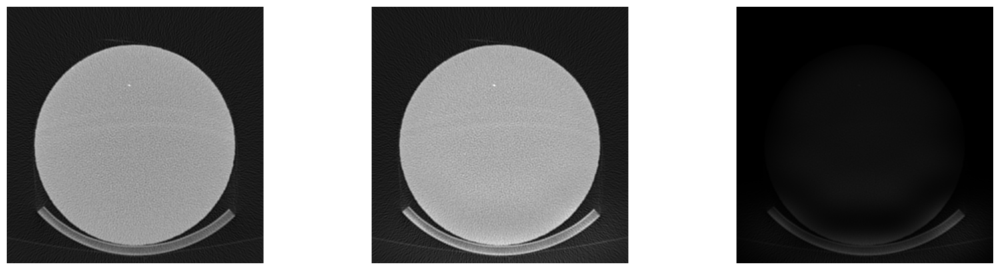

In [5]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(1, 3, figsize=(20, 5))

for ax in axs:
    ax.set_axis_off()
axs[0].imshow(sitk.GetArrayViewFromImage(res["input_image"]), cmap='gray', vmin=0, vmax=255)
axs[1].imshow(sitk.GetArrayViewFromImage(res["corrected_image"]), cmap='gray', vmin=0, vmax=255)
axs[2].imshow(sitk.GetArrayViewFromImage(res["corrected_image"]) - sitk.GetArrayViewFromImage(res["input_image"]), cmap='gray', vmin=0, vmax=255)
# axs[3].imshow(sitk.GetArrayViewFromImage(res["mask_image"]), cmap='ocean', vmin=0, vmax=1)
plt.show()

In [ ]:
res2 = main(r"C:\Users\Alina\Desktop\diploma\test\00001.png", "N4_corrected.nrrd", numberFittingLevels=10)

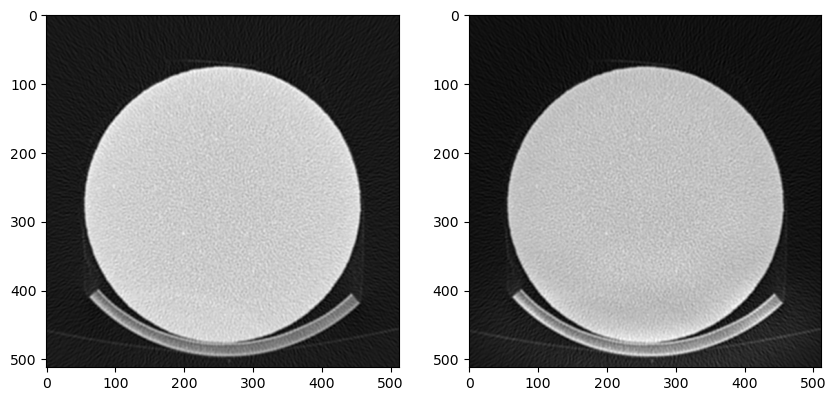

In [82]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(sitk.GetArrayViewFromImage(res["input_image"]), cmap='gray')
axs[1].imshow(sitk.GetArrayViewFromImage(res["corrected_image"]), cmap='gray')
plt.show()

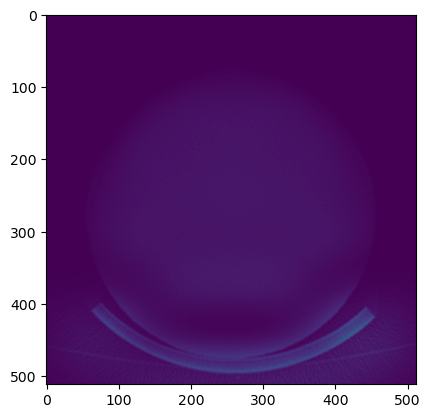

In [94]:
plt.imshow(sitk.GetArrayViewFromImage(res["corrected_image"]) - sitk.GetArrayViewFromImage(res["input_image"]), vmin=0, vmax=255)

In [21]:
import SimpleITK as sitk
import matplotlib.pyplot as plt

# Замените 'path_to_your_image.nii' на путь к вашему файлу изображения
image_path = r"C:\Users\abely\OneDrive\Desktop\1111\00031 (3).png"
image = sitk.ReadImage(image_path)


In [22]:
# Конвертируйте изображение в float32
image_float = sitk.Cast(image, sitk.sitkFloat32)

# Создайте объект корректора N4
corrector = sitk.N4BiasFieldCorrectionImageFilter()

# Примените алгоритм N4 к изображению с плавающей точкой
corrected_image = corrector.Execute(image_float)

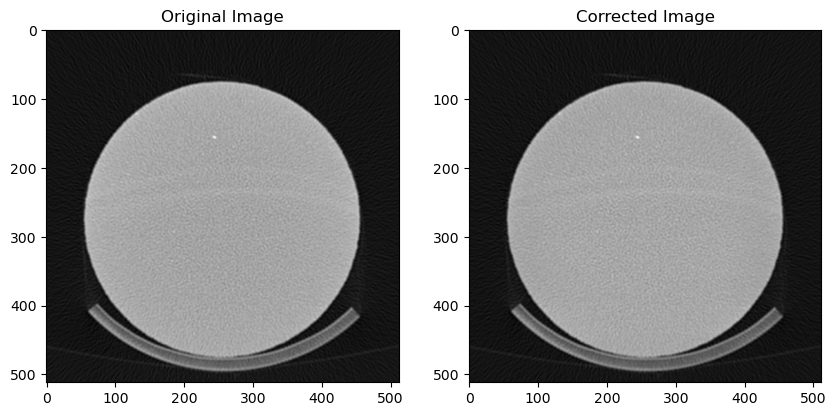

In [23]:
def display_images(original, corrected):
    nda_original = sitk.GetArrayFromImage(original)
    nda_corrected = sitk.GetArrayFromImage(corrected)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    
    # Проверяем размерности изображений
    if nda_original.ndim == 2:
        # Если изображение двумерное, отображаем напрямую
        axes[0].imshow(nda_original, cmap='gray')
        axes[1].imshow(nda_corrected, cmap='gray')
    else:
        # Если не удается определить допустимую размерность
        raise ValueError("Unsupported data shape for displaying: {}".format(nda_original.shape))

    axes[0].set_title('Original Image')
    axes[1].set_title('Corrected Image')
    plt.show()

display_images(image, corrected_image)


# N4 (Базовые параметры)

# N4 (Базовые параметры)

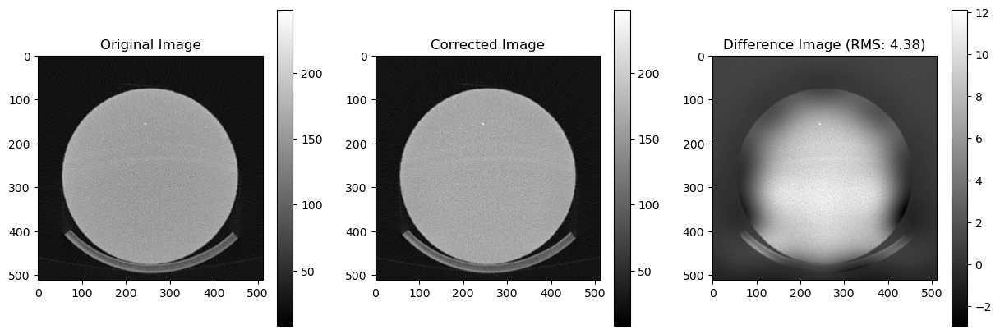

In [1]:
import SimpleITK as sitk
import matplotlib.pyplot as plt
import numpy as np

# Загрузка и чтение изображения
image_path = r"C:\Users\abely\OneDrive\Desktop\1111\00031 (3).png"
image = sitk.ReadImage(image_path, sitk.sitkFloat32)

# Создание объекта корректора N4
corrector = sitk.N4BiasFieldCorrectionImageFilter()

# Применяем корректор к изображению
corrected_image = corrector.Execute(image)

def display_difference(original, corrected):
    
    nda_original = sitk.GetArrayFromImage(original)
    nda_corrected = sitk.GetArrayFromImage(corrected)

    # Вычисляем разницу между оригинальным и скорректированным изображением
    difference = nda_corrected - nda_original
    
    # RMSE
    rmse = np.sqrt(np.mean(difference**2, axis=1))

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes = axes.flatten()

    
    # Получаем минимальное и максимальное значения для общей цветовой шкалы
    vmin = min(nda_original.min(), nda_corrected.min())
    vmax = max(nda_original.max(), nda_corrected.max())

    # Отображаем оригинальное изображение
    im0 = axes[0].imshow(nda_original, cmap='gray', vmin=vmin, vmax=vmax)
    axes[0].set_title('Original Image')
    fig.colorbar(im0, ax=axes[0])

    # Отображаем скорректированное изображение
    im1 = axes[1].imshow(nda_corrected, cmap='gray', vmin=vmin, vmax=vmax)
    axes[1].set_title('Corrected Image')
    fig.colorbar(im1, ax=axes[1])

    # Отображаем разницу
    im2 = axes[2].imshow(difference, cmap='gray',
                         # vmin=vmin, vmax=vmax,
                        )
    axes[2].set_title('Difference Image (RMS: {:.2f})'.format(np.mean(rmse)))
    fig.colorbar(im2, ax=axes[2])

    # for ax in axes:
        # ax.axis('off')  # Отключить оси 

    plt.show()

# Вызов функции отображения
display_difference(image, corrected_image)


## Рассчет RSME

In [2]:
import numpy as np


nda_original = sitk.GetArrayFromImage(image).astype(np.float32)
nda_corrected = sitk.GetArrayFromImage(corrected_image).astype(np.float32)

# RMSE
difference = nda_original - nda_corrected
rmse = np.sqrt(np.mean(difference**2, axis=1))    

print(f"RMSE:", np.mean(rmse))


RMSE: 4.378746


# N4 (Пользоватльские параметры)

```{note}
:class: dropdown
Заметки
### Аргументы командной строки
Скрипт принимает несколько параметров:
1. Путь к входному изображению.
2. Путь для сохранения выходного изображения.
3. Коэффициент уменьшения размерности изображения (необязательно).
4. Маска изображения (необязательно).
5. Число итераций для корректора (необязательно).
6. Число уровней фитинга (необязательно).

### Прочтение и подготовка изображения
- Изображение считывается (используется метод `ReadImage` для загрузки изображения) и конвертируется в тип данных `sitkFloat32`.
- Если указан коэффициент уменьшения (`shrinkFactor`), изображение уменьшается для ускорения обработки.
- Маска для изображения может быть задана явно или сгенерирована по дефолту с использованием порога (`sitk.OtsuThreshold`).

### Использование алгоритма коррекции поля смещения
- Инициализируется объект `N4BiasFieldCorrectionImageFilter`.
- Устанавливаются параметры коррекции (максимальное число итераций, число уровней фитинга).
- Применяется коррекция к изображению (с использованием маски или без).

### Обработка результата
- Вычисляется логарифмическое поле смещения.
- Исходное изображение корректируется, делится на экспоненту логарифмического поля смещения для получения изображения полного разрешения без смещения.
- Результат сохраняется (в уменьшенненном варианте, если было проведено уменьшение размера).

### Выгрузка и сохранение результатов
- Вывод содержит полную информацию о входном изображении, маске, логарифмическом поле смещения и скорректированном изображении.
```

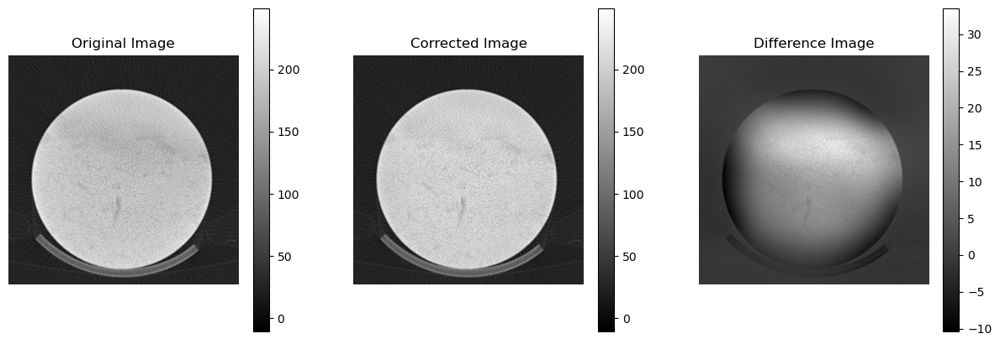

In [2]:
import sys
import os
import SimpleITK as sitk
import matplotlib.pyplot as plt
import numpy as np

def main(args):
    if len(args) < 2:
        print(
            "Usage: N4BiasFieldCorrection inputImage "
            + "outputImage [shrinkFactor] [maskImage] [numberOfIterations] "
            + "[numberFittingLevels]"
        )
        sys.exit(1)

    inputImage = sitk.ReadImage(args[1], sitk.sitkFloat32)
    image = inputImage

    # if len(args) > 4:
        # maskImage = sitk.ReadImage(args[4], sitk.sitkUInt8)
    # else:
    maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 120)

    if len(args) > 3:
        shrinkFactor = int(args[3])
        if shrinkFactor > 1:
            image = sitk.Shrink(inputImage, [shrinkFactor] * inputImage.GetDimension())
            maskImage = sitk.Shrink(maskImage, [shrinkFactor] * inputImage.GetDimension())

    corrector = sitk.N4BiasFieldCorrectionImageFilter()

    if len(args) > 6:
        numberFittingLevels = int(args[6])
    else:
        numberFittingLevels = 4

    if len(args) > 5:
        corrector.SetMaximumNumberOfIterations([int(args[5])] * numberFittingLevels)

    corrected_image = corrector.Execute(image, maskImage)

    log_bias_field = corrector.GetLogBiasFieldAsImage(inputImage)

    corrected_image_full_resolution = inputImage / sitk.Exp(log_bias_field)

    sitk.WriteImage(corrected_image_full_resolution, args[2])

    # Отрисовка изображений
    input_array = sitk.GetArrayFromImage(inputImage)
    corrected_array = sitk.GetArrayFromImage(corrected_image_full_resolution)
    difference_array = corrected_array - input_array

    # общая цветовая шкала
    global_min = min(input_array.min(), corrected_array.min(), difference_array.min())
    global_max = max(input_array.max(), corrected_array.max(), difference_array.max())

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    img0 = axes[0].imshow(input_array, cmap='gray', vmin=global_min, vmax=global_max)
    axes[0].set_title('Original Image')
    axes[0].axis('off')
    fig.colorbar(img0, ax=axes[0])

    img1 = axes[1].imshow(corrected_array, cmap='gray', vmin=global_min, vmax=global_max)
    axes[1].set_title('Corrected Image')
    axes[1].axis('off')
    fig.colorbar(img1, ax=axes[1])

    img2 = axes[2].imshow(difference_array, cmap='gray',
                          # vmin=global_min, vmax=global_max
                         )
    axes[2].set_title('Difference Image')
    axes[2].axis('off')
    fig.colorbar(img2, ax=axes[2])

    # colorbar
    # cbar = fig.colorbar(img0, ax=axes.ravel().tolist(), orientation='vertical')
    # cbar.set_label('Intensity')

    plt.show()

args = [
    "script",  # имя скрипта
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00340_corrected.nrrd",
    "1",  # shrinkFactor
    None,  # maskImage путь, если не None
    5,  # numberOfIterations 
    # "5"   # numberFittingLevels
]


main(args)


In [ ]:
from matplotlib import pyplot as plt
fig, axs = plt.subplots(1, 3, figsize=(20, 5))

for ax in axs:
    ax.set_axis_off()
axs[0].imshow(sitk.GetArrayViewFromImage(res["input_image"]), cmap='gray', vmin=0, vmax=255)
axs[1].imshow(sitk.GetArrayViewFromImage(res["corrected_image"]), cmap='gray', vmin=0, vmax=255)
axs[2].imshow(sitk.GetArrayViewFromImage(res["corrected_image"]) - sitk.GetArrayViewFromImage(res["input_image"]), cmap='gray', vmin=0, vmax=255)
axs[3].imshow(sitk.GetArrayViewFromImage(res["mask_image"]), cmap='ocean', vmin=0, vmax=1)
plt.show()

In [4]:
import sys
import os
import SimpleITK as sitk
import numpy as np

In [6]:
import matplotlib.pyplot as plt

ImportError: DLL load failed while importing _multiarray_umath: Не найден указанный модуль.

ImportError: initialization failed

## Отрисовка с графиками

In [9]:
import sys
import os
import SimpleITK as sitk
import matplotlib.pyplot as plt
import numpy as np

def main(args):
    if len(args) < 2:
        print(
            "Usage: N4BiasFieldCorrection inputImage "
            + "outputImage [shrinkFactor] [maskImage] [numberOfIterations] "
            + "[numberFittingLevels]"
        )
        sys.exit(1)

    inputImage = sitk.ReadImage(args[1], sitk.sitkFloat32)
    image = inputImage

    # if len(args) > 4:
        # maskImage = sitk.ReadImage(args[4], sitk.sitkUInt8)
    # else:
    maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 200)

    if len(args) > 3:
        shrinkFactor = int(args[3])
        if shrinkFactor > 1:
            image = sitk.Shrink(inputImage, [shrinkFactor] * inputImage.GetDimension())
            maskImage = sitk.Shrink(maskImage, [shrinkFactor] * inputImage.GetDimension())

    corrector = sitk.N4BiasFieldCorrectionImageFilter()

    if len(args) > 6:
        numberFittingLevels = int(args[6])
    else:
        numberFittingLevels = 4

    if len(args) > 5:
        corrector.SetMaximumNumberOfIterations([int(args[5])] * numberFittingLevels)

    corrected_image = corrector.Execute(image, maskImage)

    log_bias_field = corrector.GetLogBiasFieldAsImage(inputImage)

    corrected_image_full_resolution = inputImage / sitk.Exp(log_bias_field)

    sitk.WriteImage(corrected_image_full_resolution, args[2])

    # Отрисовка изображений
    input_array = sitk.GetArrayFromImage(inputImage)
    corrected_array = sitk.GetArrayFromImage(corrected_image_full_resolution)
    difference_array = corrected_array - input_array

    # Общая цветовая шкала
    global_min = min(input_array.min(), corrected_array.min(), difference_array.min())
    global_max = max(input_array.max(), corrected_array.max(), difference_array.max())

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    img0 = axes[0, 0].imshow(input_array, cmap='gray', vmin=global_min, vmax=global_max)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    fig.colorbar(img0, ax=axes[0, 0])

    img1 = axes[0, 1].imshow(corrected_array, cmap='gray', vmin=global_min, vmax=global_max)
    axes[0, 1].set_title('Corrected Image')
    axes[0, 1].axis('off')
    fig.colorbar(img1, ax=axes[0, 1])

    img2 = axes[0, 2].imshow(difference_array, cmap='gray')
    axes[0, 2].set_title('Difference Image')
    axes[0, 2].axis('off')
    fig.colorbar(img2, ax=axes[0, 2])

    # Горизонтальная прямоугольная область
    height, width = input_array.shape
    region_height = 20  # высота прямоугольной области
    region_x = 0
    region_y = height // 2 - region_height // 2

    # Рисуем прямоугольник на оригинальном изображении
    rect = plt.Rectangle((region_x, region_y), width, region_height, 
                         linewidth=1.5, edgecolor='r', facecolor='none')
    axes[0, 0].add_patch(rect)

    # Построение графиков
    central_region = input_array[region_y:region_y + region_height, :]
    mean_intensity = central_region.mean(axis=0)
    axes[1, 0].plot(mean_intensity)
    axes[1, 0].set_title('Ср. яркость вдоль профиля')
    axes[1, 0].set_xlabel('Pixel column')
    axes[1, 0].set_ylabel('Intensity')

    corrected_central_region = corrected_array[region_y:region_y + region_height, :]
    corrected_mean_intensity = corrected_central_region.mean(axis=0)
    axes[1, 1].plot(corrected_mean_intensity)
    axes[1, 1].set_title('Ср. яркость вдоль профиля на скорректированном')
    axes[1, 1].set_xlabel('Pixel column')
    axes[1, 1].set_ylabel('Intensity')

    difference_central_region = difference_array[region_y:region_y + region_height, :]
    difference_mean_intensity = difference_central_region.mean(axis=0)
    axes[1, 2].plot(difference_mean_intensity)
    axes[1, 2].set_title('Ср. яркость вдоль профиля на разнице')
    axes[1, 2].set_xlabel('Pixel column')
    axes[1, 2].set_ylabel('Intensity')

    plt.tight_layout()
    plt.show()

# args = [
#     "script",  # имя скрипта
#     r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
#     r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00340_corrected.nrrd",
#     "1",  # shrinkFactor
#     None,  # maskImage путь, если не None
#     15,  # numberOfIterations 
#     "2"   # numberFittingLevels
# ]




args = [
    "script",  # имя скрипта
    # r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\tom_snimki\3697.70-3698.45_2815.bmp",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\3697.70-3698.45_2815.nrrd",
    "1",  # shrinkFactor
    None,  # maskImage путь, если не None
    "10",  # numberOfIterations 
    "5"   # numberFittingLevels
]

main(args)


RuntimeError: Exception thrown in SimpleITK ImageFileReader_Execute: D:\a\SimpleITK\SimpleITK\Code\IO\src\sitkImageReaderBase.cxx:91:
sitk::ERROR: The file "C:\Users\abely\Downloads\i01_00340 (2).pngC:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\3i01_00340.nrrd" does not exist.

Image correction 3.15 seconds.


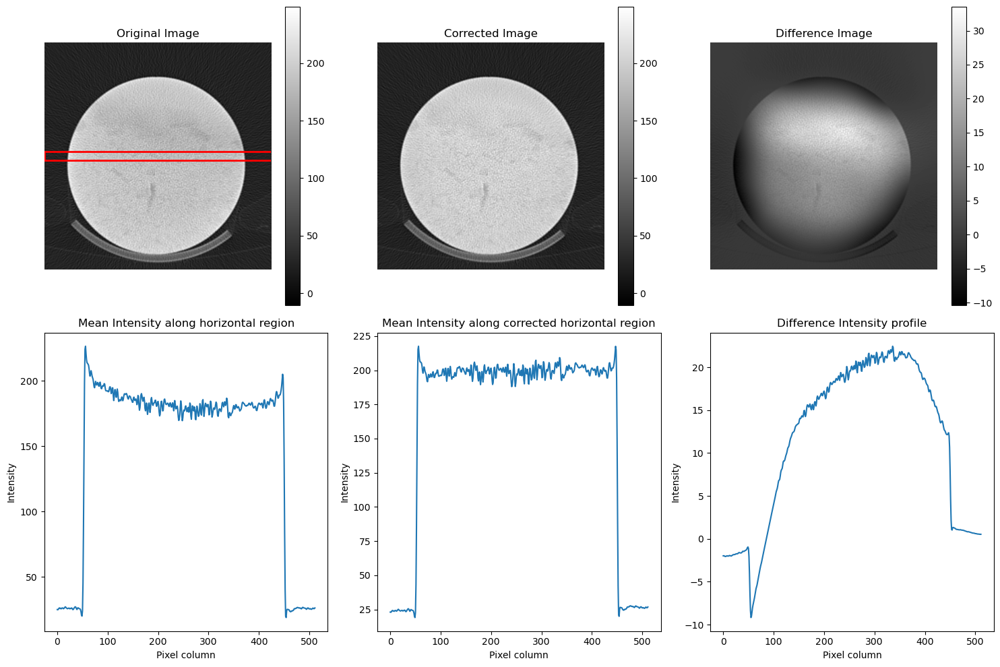

In [30]:
import sys
import os
import SimpleITK as sitk
import matplotlib.pyplot as plt
import numpy as np
import time

def main(args):
    if len(args) < 2:
        print(
            "Usage: N4BiasFieldCorrection inputImage "
            + "outputImage [shrinkFactor] [maskImage] [numberOfIterations] "
            + "[numberFittingLevels]"
        )
        sys.exit(1)

    inputImage = sitk.ReadImage(args[1], sitk.sitkFloat32)
    image = inputImage

    maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 100)

    if len(args) > 3:
        shrinkFactor = int(args[3])
        if shrinkFactor > 1:
            image = sitk.Shrink(inputImage, [shrinkFactor] * inputImage.GetDimension())
            maskImage = sitk.Shrink(maskImage, [shrinkFactor] * inputImage.GetDimension())

    corrector = sitk.N4BiasFieldCorrectionImageFilter()

    if len(args) > 6:
        numberFittingLevels = int(args[6])
    else:
        numberFittingLevels = 4

    if len(args) > 5:
        corrector.SetMaximumNumberOfIterations([int(args[5])] * numberFittingLevels)

    # Начало отслеживания времени
    start_time = time.time()

    corrected_image = corrector.Execute(image, maskImage)
    log_bias_field = corrector.GetLogBiasFieldAsImage(inputImage)
    corrected_image_full_resolution = inputImage / sitk.Exp(log_bias_field)

    # Окончание отслеживания времени
    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f"Image correction {elapsed_time:.2f} seconds.")

    sitk.WriteImage(corrected_image_full_resolution, args[2])

    # Отрисовка изображений
    input_array = sitk.GetArrayFromImage(inputImage)
    corrected_array = sitk.GetArrayFromImage(corrected_image_full_resolution)
    difference_array = corrected_array - input_array

    # Общая цветовая шкала
    global_min = min(input_array.min(), corrected_array.min(), difference_array.min())
    global_max = max(input_array.max(), corrected_array.max(), difference_array.max())

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    img0 = axes[0, 0].imshow(input_array, cmap='gray', vmin=global_min, vmax=global_max)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    fig.colorbar(img0, ax=axes[0, 0])

    img1 = axes[0, 1].imshow(corrected_array, cmap='gray', vmin=global_min, vmax=global_max)
    axes[0, 1].set_title('Corrected Image')
    axes[0, 1].axis('off')
    fig.colorbar(img1, ax=axes[0, 1])

    img2 = axes[0, 2].imshow(difference_array, cmap='gray')
    axes[0, 2].set_title('Difference Image')
    axes[0, 2].axis('off')
    fig.colorbar(img2, ax=axes[0, 2])

    # Горизонтальная центральная линия или прямоугольная область
    height, width = input_array.shape
    region_height = 20  # высота прямоугольной области
    region_x = 0
    region_y = height // 2 - region_height // 2

    # Рисуем прямоугольник на оригинальном изображении
    rect = plt.Rectangle((region_x, region_y), width, region_height, 
                         linewidth=2, edgecolor='r', facecolor='none')
    axes[0, 0].add_patch(rect)

    # Построение графиков
    central_region = input_array[region_y:region_y + region_height, :]
    mean_intensity = central_region.mean(axis=0)
    axes[1, 0].plot(mean_intensity)
    axes[1, 0].set_title('Mean Intensity along horizontal region')
    axes[1, 0].set_xlabel('Pixel column')
    axes[1, 0].set_ylabel('Intensity')

    corrected_central_region = corrected_array[region_y:region_y + region_height, :]
    corrected_mean_intensity = corrected_central_region.mean(axis=0)
    axes[1, 1].plot(corrected_mean_intensity)
    axes[1, 1].set_title('Mean Intensity along corrected horizontal region')
    axes[1, 1].set_xlabel('Pixel column')
    axes[1, 1].set_ylabel('Intensity')

    difference_central_region = difference_array[region_y:region_y + region_height, :]
    difference_mean_intensity = difference_central_region.mean(axis=0)
    axes[1, 2].plot(difference_mean_intensity)
    axes[1, 2].set_title('Difference Intensity profile')
    axes[1, 2].set_xlabel('Pixel column')
    axes[1, 2].set_ylabel('Intensity')

    plt.tight_layout()
    plt.show()

args = [
    "script",  # имя скрипта
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00340_corrected.nrrd",
    "1",  # shrinkFactor
    None,  # maskImage путь, если не None
    5,  # numberOfIterations 
    # "5"   # numberFittingLevels
]

main(args)


### Маска + метрика

In [14]:
pip install --upgrade matplotlib

Note: you may need to restart the kernel to use updated packages.


In [15]:
import sys
import os
import SimpleITK as sitk
import matplotlib.pyplot as plt
import numpy as np
import time
import cv2

ImportError: DLL load failed while importing _multiarray_umath: Не найден указанный модуль.

ImportError: initialization failed

In [12]:
def detect_and_create_mask(image_path):
    # Загрузите изображение в градациях серого
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Примените размытие по Гауссу для уменьшения шума
    blurred_image = cv2.GaussianBlur(image, (25, 25), 2)

    # Обнаружение кругов с использованием преобразования Хаффа
    rows = blurred_image.shape[0]
    circles = cv2.HoughCircles(blurred_image, cv2.HOUGH_GRADIENT, dp=1, minDist=rows / 8,
                               param1=60, param2=40, minRadius=100, maxRadius=220)

    # Создание бинарной маски такого же размера, как и изображение
    mask = np.zeros_like(image, dtype=np.uint8)

    # Если обнаружены круги, нарисуйте их на маске
    if circles is not None:
        circles = np.uint16(np.around(circles))
        for i in circles[0, :]:
            center = (i[0], i[1])  # Центр круга
            radius = i[2]  # Радиус круга
            # Нарисуйте круг на маске
            cv2.circle(mask, center, radius, 255, thickness=cv2.FILLED)
            
    mask = mask // 255

    return mask

def main(args):
    if len(args) < 2:
        print(
            "Usage: N4BiasFieldCorrection inputImage "
            + "outputImage [shrinkFactor] [maskImage] [numberOfIterations] "
            + "[numberFittingLevels]"
        )
        sys.exit(1)

    inputImage = sitk.ReadImage(args[1], sitk.sitkFloat32)
    image = inputImage

    if len(args) > 4 and args[4] is not None:
        # Используем путь для обнаружения кругов и создания маски
        mask_np = detect_and_create_mask(args[4])
        maskImage = sitk.GetImageFromArray(mask_np, isVector=False)
        maskImage = sitk.Cast(maskImage, sitk.sitkUInt8)  
        maskImage.CopyInformation(inputImage)  # Copy metadata
    else:
        maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 120)

    if len(args) > 3:
        shrinkFactor = int(args[3])
        if shrinkFactor > 1:
            image = sitk.Shrink(inputImage, [shrinkFactor] * inputImage.GetDimension())
            maskImage = sitk.Shrink(maskImage, [shrinkFactor] * inputImage.GetDimension())

    corrector = sitk.N4BiasFieldCorrectionImageFilter()

    if len(args) > 6:
        numberFittingLevels = int(args[6])
    else:
        numberFittingLevels = 4

    if len(args) > 5:
        corrector.SetMaximumNumberOfIterations([int(args[5])] * numberFittingLevels)

    # Начало отслеживания времени
    start_time = time.time()

    corrected_image = corrector.Execute(image, maskImage)
    log_bias_field = corrector.GetLogBiasFieldAsImage(inputImage)
    corrected_image_full_resolution = inputImage / sitk.Exp(log_bias_field)

    # Окончание отслеживания времени
    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f"Image correction {elapsed_time:.2f} seconds.")

    sitk.WriteImage(corrected_image_full_resolution, args[2])

    # Отрисовка изображений
    input_array = sitk.GetArrayFromImage(inputImage)
    corrected_array = sitk.GetArrayFromImage(corrected_image_full_resolution)
    difference_array = corrected_array - input_array
    mask_array = sitk.GetArrayFromImage(maskImage)

    # Общая цветовая шкала
    global_min = min(input_array.min(), corrected_array.min(), difference_array.min())
    global_max = max(input_array.max(), corrected_array.max(), difference_array.max())

    fig, axes = plt.subplots(2, 4, figsize=(20, 10))

    # Отображение оригинала
    img0 = axes[0, 0].imshow(input_array, cmap='gray', vmin=global_min, vmax=global_max)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    fig.colorbar(img0, ax=axes[0, 0])

    # Отображение скорректированного
    img1 = axes[0, 1].imshow(corrected_array, cmap='gray', vmin=global_min, vmax=global_max)
    axes[0, 1].set_title('Corrected Image')
    axes[0, 1].axis('off')
    fig.colorbar(img1, ax=axes[0, 1])

    # Отображение разницы
    img2 = axes[0, 2].imshow(difference_array, cmap='gray')
    axes[0, 2].set_title('Difference Image')
    axes[0, 2].axis('off')
    fig.colorbar(img2, ax=axes[0, 2])

    # Отображение маски
    img3 = axes[0, 3].imshow(mask_array, cmap='gray')
    axes[0, 3].set_title('Mask Image')
    axes[0, 3].axis('off')
    fig.colorbar(img3, ax=axes[0, 3])

    # Горизонтальная прямоугольная область
    height, width = input_array.shape
    region_height = 20  # высота прямоугольной области
    region_x = 0
    region_y = height // 2 - region_height // 2

    # Рисуем прямоугольник на оригинальном изображении
    rect = plt.Rectangle((region_x, region_y), width, region_height, 
                         linewidth=2, edgecolor='r', facecolor='none')
    axes[0, 0].add_patch(rect)

    # Построение графиков
    central_region = input_array[region_y:region_y + region_height, :]
    mean_intensity = central_region.mean(axis=0)
    axes[1, 0].plot(mean_intensity)
    axes[1, 0].set_title('Mean Intensity along horizontal region')
    axes[1, 0].set_xlabel('Pixel column')
    axes[1, 0].set_ylabel('Intensity')

    corrected_central_region = corrected_array[region_y:region_y + region_height, :]
    corrected_mean_intensity = corrected_central_region.mean(axis=0)
    axes[1, 1].plot(corrected_mean_intensity)
    axes[1, 1].set_title('Mean Intensity along corrected horizontal region')
    axes[1, 1].set_xlabel('Pixel column')
    axes[1, 1].set_ylabel('Intensity')

    difference_central_region = difference_array[region_y:region_y + region_height, :]
    difference_mean_intensity = difference_central_region.mean(axis=0)
    axes[1, 2].plot(difference_mean_intensity)
    axes[1, 2].set_title('Difference Intensity profile')
    axes[1, 2].set_xlabel('Pixel column')
    axes[1, 2].set_ylabel('Intensity')
    
    # пустой график для выравнивания
    axes[1, 3].axis('off')

    # Расчет метрики для оригинального изображения
    original_slice_200_300_mean = input_array[region_y:region_y + region_height, 200:300].mean()
    original_slice_70_430_mean = input_array[region_y:region_y + region_height, 70:430].mean()
    original_metric = original_slice_200_300_mean / original_slice_70_430_mean
    print(f"Original Image Metric: {original_metric:.4f}")

    # Расчет метрики для скорректированного изображения
    corrected_slice_200_300_mean = corrected_array[region_y:region_y + region_height, 200:300].mean()
    corrected_slice_70_430_mean = corrected_array[region_y:region_y + region_height, 70:430].mean()
    corrected_metric = corrected_slice_200_300_mean / corrected_slice_70_430_mean
    print(f"Corrected Image Metric: {corrected_metric:.4f}")



    plt.tight_layout()
    plt.show()

args = [
    "script",  # имя скрипта
    # r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    # r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\tom_snimki\3697.70-3698.45_2815.bmp",
    r"C:\Users\abely\Downloads\i01_00340 (2).png",
    # r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\tom_snimki\3697.70-3698.45_0624.bmp",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\3697.70-3698.45_2815.nrrd",
    "1",  # shrinkFactor
    # r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\tom_snimki\3697.70-3698.45_2815.bmp",
    # r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\tom_snimki\3697.70-3698.45_0624.bmp",
    None,  # maskImage путь, если не None
    "10",  # numberOfIterations 
    "5"   # numberFittingLevels
]

main(args)


Image correction 7.10 seconds.


NameError: name 'plt' is not defined

In [11]:
import time

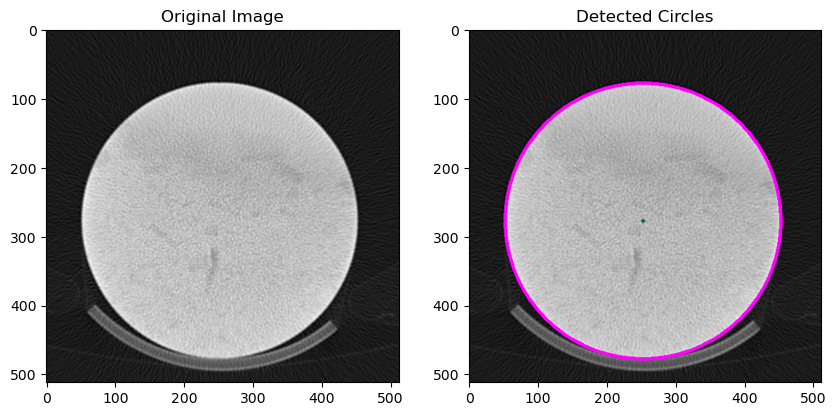

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Загрузите изображение в градациях серого
image_path = r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png"
# image_path = r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\tom_snimki\3697.70-3698.45_80_2815.bmp"
# image_path = r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\tom_snimki\00995.png"
# image_path = r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00978.bmp"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Примените размытие по Гауссу для уменьшения шума
blurred_image = cv2.GaussianBlur(image, (29, 29), 2)

# Обнаружение кругов с использованием преобразования Хаффа
rows = blurred_image.shape[0]
circles = cv2.HoughCircles(blurred_image, cv2.HOUGH_GRADIENT, dp=1, minDist=rows / 8,
                           param1=60, param2=40, minRadius=100, maxRadius=220)

# Создание копии изображения для отображения результатов
output = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)

# Прорисовка найденных кругов
if circles is not None:
    circles = np.uint16(np.around(circles))
    for i in circles[0, :]:
        center = (i[0], i[1])  # Центр круга
        cv2.circle(output, center, 1, (0, 100, 100), 3)  # центр круга
        radius = i[2]  # Радиус круга
        cv2.circle(output, center, radius, (255, 0, 255), 3)  # Описание окружности

# Визуализация
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')

plt.subplot(1, 2, 2)
plt.title("Detected Circles")
plt.imshow(output)

plt.show()


Image correction 2.98 seconds.
Original Image Metric: 0.9784
Corrected Image Metric: 0.9965


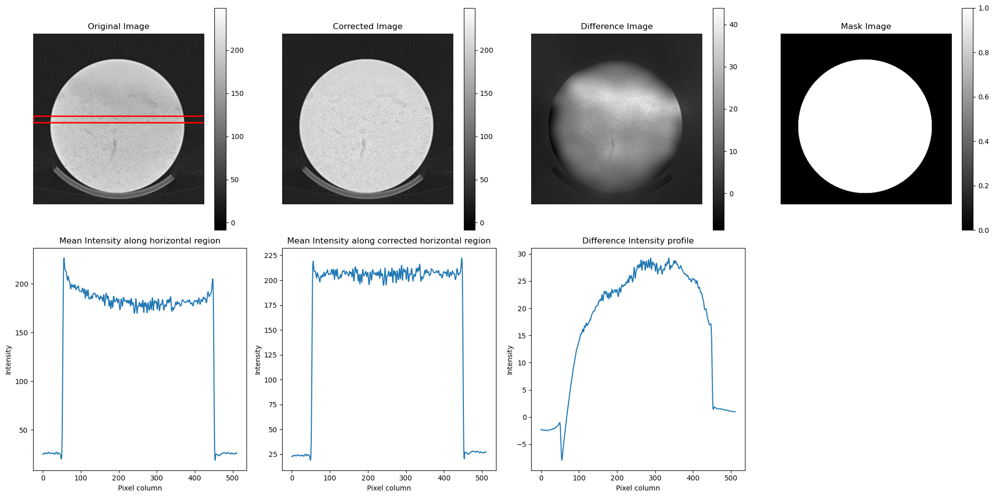

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import SimpleITK as sitk
import sys
import time

def detect_and_create_mask(image_path):
    # Загрузите изображение в градациях серого
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Примените размытие по Гауссу для уменьшения шума
    blurred_image = cv2.GaussianBlur(image, (25, 25), 2)

    # Обнаружение кругов с использованием преобразования Хаффа
    rows = blurred_image.shape[0]
    circles = cv2.HoughCircles(blurred_image, cv2.HOUGH_GRADIENT, dp=1, minDist=rows / 8,
                               param1=60, param2=40, minRadius=100, maxRadius=220)

    # Создание бинарной маски такого же размера, как и изображение
    mask = np.zeros_like(image, dtype=np.uint8)

    # Если обнаружены круги, нарисуйте их на маске
    if circles is not None:
        circles = np.uint16(np.around(circles))
        for i in circles[0, :]:
            center = (i[0], i[1])  # Центр круга
            radius = i[2]  # Радиус круга
            # Нарисуйте круг на маске
            cv2.circle(mask, center, radius, 255, thickness=cv2.FILLED)
            
    mask = mask // 255

    return mask

def main(args):
    if len(args) < 2:
        print(
            "Usage: N4BiasFieldCorrection inputImage "
            + "outputImage [shrinkFactor] [maskImage] [numberOfIterations] "
            + "[numberFittingLevels]"
        )
        sys.exit(1)

    inputImage = sitk.ReadImage(args[1], sitk.sitkFloat32)
    image = inputImage

    if len(args) > 4 and args[4] is not None:
        # Используем путь для обнаружения кругов и создания маски
        mask_np = detect_and_create_mask(args[4])
        maskImage = sitk.GetImageFromArray(mask_np, isVector=False)
        maskImage = sitk.Cast(maskImage, sitk.sitkUInt8)  
        maskImage.CopyInformation(inputImage)  # Copy metadata
    else:
        maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 120)

    if len(args) > 3:
        shrinkFactor = int(args[3])
        if shrinkFactor > 1:
            image = sitk.Shrink(inputImage, [shrinkFactor] * inputImage.GetDimension())
            maskImage = sitk.Shrink(maskImage, [shrinkFactor] * inputImage.GetDimension())

    corrector = sitk.N4BiasFieldCorrectionImageFilter()

    if len(args) > 6:
        numberFittingLevels = int(args[6])
    else:
        numberFittingLevels = 4

    if len(args) > 5:
        corrector.SetMaximumNumberOfIterations([int(args[5])] * numberFittingLevels)

    # Начало отслеживания времени
    start_time = time.time()

    corrected_image = corrector.Execute(image, maskImage)
    log_bias_field = corrector.GetLogBiasFieldAsImage(inputImage)
    corrected_image_full_resolution = inputImage / sitk.Exp(log_bias_field)

    # Окончание отслеживания времени
    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f"Image correction {elapsed_time:.2f} seconds.")

    # Запись скорректированного изображения
    sitk.WriteImage(corrected_image_full_resolution, args[2])

    # Отрисовка изображений
    input_array = sitk.GetArrayFromImage(inputImage)
    corrected_array = sitk.GetArrayFromImage(corrected_image_full_resolution)
    difference_array = corrected_array - input_array
    mask_array = sitk.GetArrayFromImage(maskImage)

    # Общая цветовая шкала
    global_min = min(input_array.min(), corrected_array.min(), difference_array.min())
    global_max = max(input_array.max(), corrected_array.max(), difference_array.max())

    fig, axes = plt.subplots(2, 4, figsize=(20, 10))

    # Отображение оригинала
    img0 = axes[0, 0].imshow(input_array, cmap='gray', vmin=global_min, vmax=global_max)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    fig.colorbar(img0, ax=axes[0, 0])

    # Отображение скорректированного
    img1 = axes[0, 1].imshow(corrected_array, cmap='gray', vmin=global_min, vmax=global_max)
    axes[0, 1].set_title('Corrected Image')
    axes[0, 1].axis('off')
    fig.colorbar(img1, ax=axes[0, 1])

    # Отображение разницы
    img2 = axes[0, 2].imshow(difference_array, cmap='gray')
    axes[0, 2].set_title('Difference Image')
    axes[0, 2].axis('off')
    fig.colorbar(img2, ax=axes[0, 2])

    # Отображение маски
    img3 = axes[0, 3].imshow(mask_array, cmap='gray')
    axes[0, 3].set_title('Mask Image')
    axes[0, 3].axis('off')
    fig.colorbar(img3, ax=axes[0, 3])

    # Горизонтальная прямоугольная область
    height, width = input_array.shape
    region_height = 20  # высота прямоугольной области
    region_x = 0
    region_y = height // 2 - region_height // 2

    # Рисуем прямоугольник на оригинальном изображении
    rect = plt.Rectangle((region_x, region_y), width, region_height, 
                         linewidth=2, edgecolor='r', facecolor='none')
    axes[0, 0].add_patch(rect)

    # Построение графиков
    central_region = input_array[region_y:region_y + region_height, :]
    mean_intensity = central_region.mean(axis=0)
    axes[1, 0].plot(mean_intensity)
    axes[1, 0].set_title('Mean Intensity along horizontal region')
    axes[1, 0].set_xlabel('Pixel column')
    axes[1, 0].set_ylabel('Intensity')

    corrected_central_region = corrected_array[region_y:region_y + region_height, :]
    corrected_mean_intensity = corrected_central_region.mean(axis=0)
    axes[1, 1].plot(corrected_mean_intensity)
    axes[1, 1].set_title('Mean Intensity along corrected horizontal region')
    axes[1, 1].set_xlabel('Pixel column')
    axes[1, 1].set_ylabel('Intensity')

    difference_central_region = difference_array[region_y:region_y + region_height, :]
    difference_mean_intensity = difference_central_region.mean(axis=0)
    axes[1, 2].plot(difference_mean_intensity)
    axes[1, 2].set_title('Difference Intensity profile')
    axes[1, 2].set_xlabel('Pixel column')
    axes[1, 2].set_ylabel('Intensity')

    # пустой график для выравнивания
    axes[1, 3].axis('off')

    # Расчет метрики для оригинального изображения
    original_slice_200_300_mean = input_array[region_y:region_y + region_height, 200:300].mean()
    original_slice_70_430_mean = input_array[region_y:region_y + region_height, 70:430].mean()
    original_metric = original_slice_200_300_mean / original_slice_70_430_mean
    print(f"Original Image Metric: {original_metric:.4f}")

    # Расчет метрики для скорректированного изображения
    corrected_slice_200_300_mean = corrected_array[region_y:region_y + region_height, 200:300].mean()
    corrected_slice_70_430_mean = corrected_array[region_y:region_y + region_height, 70:430].mean()
    corrected_metric = corrected_slice_200_300_mean / corrected_slice_70_430_mean
    print(f"Corrected Image Metric: {corrected_metric:.4f}")


    plt.tight_layout()
    plt.show()

# Пример вызова с аргументами
args = [
    "script",  # имя скрипта
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00340_corrected.nrrd",
    "1",  # shrinkFactor
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",  # Путь к изображению для создания маски
    "10",  # numberOfIterations 
    "5"   # numberFittingLevels
]

main(args)


In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import SimpleITK as sitk
import sys
import time

def detect_and_create_mask(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    blurred_image = cv2.GaussianBlur(image, (25, 25), 2)
    rows = blurred_image.shape[0]
    circles = cv2.HoughCircles(blurred_image, cv2.HOUGH_GRADIENT, dp=1, minDist=rows / 8,
                               param1=60, param2=40, minRadius=100, maxRadius=220)
    mask = np.zeros_like(image, dtype=np.uint8)
    if circles is not None:
        circles = np.uint16(np.around(circles))
        for i in circles[0, :]:
            center = (i[0], i[1])
            radius = i[2]
            cv2.circle(mask, center, radius, 255, thickness=cv2.FILLED)
            return center, radius, mask // 255
    return (0, 0), 0, mask // 255

def create_circular_mask(shape, center, radius, width):
    mask = np.zeros(shape, dtype=np.uint8)
    cv2.circle(mask, center, radius, 1, thickness=cv2.FILLED)
    cv2.circle(mask, center, radius - width, 0, thickness=cv2.FILLED)
    return mask

def normalize_image(image):
    image_min = image.min()
    image_max = image.max()
    return ((image - image_min) / (image_max - image_min) * 255).astype(np.uint8)

def main(args):
    if len(args) < 2:
        print(
            "Usage: N4BiasFieldCorrection inputImage "
            + "outputImage [shrinkFactor] [maskImage] [numberOfIterations] "
            + "[numberFittingLevels]"
        )
        sys.exit(1)

    inputImage = sitk.ReadImage(args[1], sitk.sitkFloat32)
    image = inputImage

    if len(args) > 4 and args[4] is not None:
        center, radius, mask_np = detect_and_create_mask(args[4])
        maskImage = sitk.GetImageFromArray(mask_np, isVector=False)
        maskImage = sitk.Cast(maskImage, sitk.sitkUInt8)
        maskImage.CopyInformation(inputImage)
    else:
        
        maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 255)
        
        maskImage =  np.ones_like(image, dtype=np.uint8) 
        
        center = (inputImage.GetWidth() // 2, inputImage.GetHeight() // 2)
        radius = min(center)

    if len(args) > 3:
        shrinkFactor = int(args[3])
        if shrinkFactor > 1:
            image = sitk.Shrink(inputImage, [shrinkFactor] * inputImage.GetDimension())
            maskImage = sitk.Shrink(maskImage, [shrinkFactor] * inputImage.GetDimension())

    corrector = sitk.N4BiasFieldCorrectionImageFilter()

    if len(args) > 6:
        numberFittingLevels = int(args[6])
    else:
        numberFittingLevels = 4

    if len(args) > 5:
        corrector.SetMaximumNumberOfIterations([int(args[5])] * numberFittingLevels)

    start_time = time.time()
    corrected_image = corrector.Execute(image, maskImage)
    log_bias_field = corrector.GetLogBiasFieldAsImage(inputImage)
    corrected_image_full_resolution = inputImage / sitk.Exp(log_bias_field)
    end_time = time.time()

    print(f"Image correction {end_time - start_time:.2f} seconds.")

    sitk.WriteImage(corrected_image_full_resolution, args[2])

    input_array = sitk.GetArrayFromImage(inputImage)
    corrected_array = sitk.GetArrayFromImage(corrected_image_full_resolution)
    difference_array = corrected_array - input_array
    mask_array = sitk.GetArrayFromImage(maskImage)

    fig, axes = plt.subplots(2, 4, figsize=(20, 10))

    # Общая цветовая шкала
    global_min = min(input_array.min(), corrected_array.min(), difference_array.min())
    global_max = max(input_array.max(), corrected_array.max(), difference_array.max())

    # Отображение оригинала
    img0 = axes[0, 0].imshow(input_array, cmap='seismic', vmin=global_min, vmax=global_max)
    axes[0, 0].set_title('Original Image')
    fig.colorbar(img0, ax=axes[0, 0])

    # Отображение скорректированного
    img1 = axes[0, 1].imshow(corrected_array, cmap='seismic', vmin=global_min, vmax=global_max)
    axes[0, 1].set_title('Corrected Image')
    fig.colorbar(img1, ax=axes[0, 1])

    # Отображение разницы
    img2 = axes[0, 2].imshow(difference_array, cmap='seismic')
    axes[0, 2].set_title('Difference Image')
    fig.colorbar(img2, ax=axes[0, 2])

    # Отображение маски
    img3 = axes[0, 3].imshow(mask_array, cmap='gray', vmin=0, vmax=1)
    axes[0, 3].set_title('Mask Image')
    fig.colorbar(img3, ax=axes[0, 3])

    
    # Рисуем кольца на изображении
    central_ring_radius = radius // 3
    central_ring_width = 60
    edge_ring_radius = radius - 1
    edge_ring_width = 20

    central_circle = plt.Circle(center, central_ring_radius, color='darkgreen', fill=False, lw=2)
    central_inner_circle = plt.Circle(center, central_ring_radius - central_ring_width, color='darkgreen', fill=False, lw=2)
    edge_circle = plt.Circle(center, edge_ring_radius, color='yellow', fill=False, lw=2)
    edge_inner_circle = plt.Circle(center, edge_ring_radius - edge_ring_width, color='yellow', fill=False, lw=2)

    axes[0, 0].add_patch(central_circle)
    axes[0, 0].add_patch(central_inner_circle)
    axes[0, 0].add_patch(edge_circle)
    axes[0, 0].add_patch(edge_inner_circle)
    
    # Расчет метрики в кольцевых областях
    central_ring_mask = create_circular_mask(input_array.shape, center, central_ring_radius, central_ring_width)
    edge_ring_mask = create_circular_mask(input_array.shape, center, edge_ring_radius, edge_ring_width)

    central_original_mean = input_array[central_ring_mask == 1].mean()
    edge_original_mean = input_array[edge_ring_mask == 1].mean()
    original_metric = central_original_mean / edge_original_mean
    print(f"Original Image Metric: {original_metric:.2f}")

    central_corrected_mean = corrected_array[central_ring_mask == 1].mean()
    edge_corrected_mean = corrected_array[edge_ring_mask == 1].mean()
    corrected_metric = central_corrected_mean / edge_corrected_mean
    print(f"Corrected Image Metric: {corrected_metric:.2f}")

    # Горизонтальная прямоугольная область
    height, width = input_array.shape
    region_height = 40  # высота прямоугольной области
    region_x = 0
    region_y = height // 2 - region_height // 2 + 20

    # Рисуем прямоугольник на оригинальном изображении
    rect = plt.Rectangle((region_x, region_y), width, region_height, 
                         linewidth=2, edgecolor='k', facecolor='none')
    axes[0, 0].add_patch(rect)

    # Интенсивность вдоль профиля
    central_region = input_array[region_y:region_y + region_height, :]
    mean_intensity = central_region.mean(axis=0)

    corrected_central_region = corrected_array[region_y:region_y + region_height, :]
    corrected_mean_intensity = corrected_central_region.mean(axis=0)

    intensity_min = min(mean_intensity.min(), corrected_mean_intensity.min())
    intensity_max = max(mean_intensity.max(), corrected_mean_intensity.max())

    # Построение графиков
    axes[1, 0].plot(mean_intensity)
    axes[1, 0].set_title('Mean Intensity along profile')
    axes[1, 0].set_xlabel('Pixel column')
    axes[1, 0].set_ylabel('Intensity')
    axes[1, 0].set_ylim(intensity_min, intensity_max)

    axes[1, 1].plot(corrected_mean_intensity)
    axes[1, 1].set_title('Mean Intensity along corrected profile')
    axes[1, 1].set_xlabel('Pixel column')
    axes[1, 1].set_ylabel('Intensity')
    axes[1, 1].set_ylim(intensity_min, intensity_max)

    difference_central_region = difference_array[region_y:region_y + region_height, :]
    difference_mean_intensity = difference_central_region.mean(axis=0)
    axes[1, 2].plot(difference_mean_intensity)
    axes[1, 2].set_title('Difference Intensity profile')
    axes[1, 2].set_xlabel('Pixel column')
    axes[1, 2].set_ylabel('Intensity')
    axes[1, 2].set_ylim(intensity_min, intensity_max)

    # пустой график для выравнивания
    axes[1, 3].axis('off')

    plt.tight_layout()
    plt.show()

# Пример вызова с аргументами
args = [
    "script",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00340_corrected.nrrd",
    "1",
    # r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    None,
    "8",
    "6"
]

main(args)


TypeError: Wrong number or type of arguments for overloaded function 'N4BiasFieldCorrectionImageFilter_Execute'.
  Possible C/C++ prototypes are:
    itk::simple::N4BiasFieldCorrectionImageFilter::Execute(itk::simple::Image const &,itk::simple::Image const &)
    itk::simple::N4BiasFieldCorrectionImageFilter::Execute(itk::simple::Image const &)


In [8]:
print(maskImage)

NameError: name 'maskImage' is not defined

### Shrinkfactor

#### Затраты по времени

Shrink factor 1: Image correction 6.59 seconds.
Shrink factor 2: Image correction 2.39 seconds.
Shrink factor 3: Image correction 1.78 seconds.
Shrink factor 4: Image correction 1.49 seconds.
Shrink factor 5: Image correction 1.52 seconds.


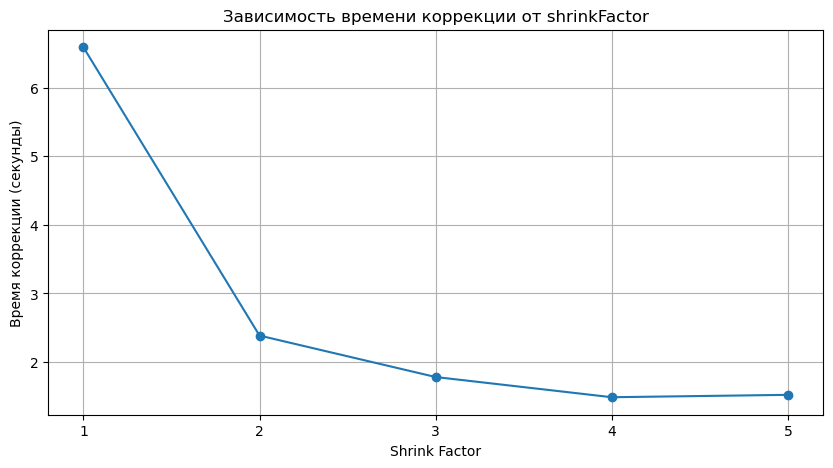

In [89]:
def run_experiment(args):
    inputImage = sitk.ReadImage(args[1], sitk.sitkFloat32)
    times = []
    shrink_factors = range(1, 6)

    for shrinkFactor in shrink_factors:
        image = inputImage
        maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 150)

        if shrinkFactor > 1:
            image = sitk.Shrink(inputImage, [shrinkFactor] * inputImage.GetDimension())
            maskImage = sitk.Shrink(maskImage, [shrinkFactor] * inputImage.GetDimension())

        corrector = sitk.N4BiasFieldCorrectionImageFilter()
        numberFittingLevels = 4
        corrector.SetMaximumNumberOfIterations([50] * numberFittingLevels)

        # Start timing
        start_time = time.time()

        corrected_image = corrector.Execute(image, maskImage)

        # End timing
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"Shrink factor {shrinkFactor}: Image correction {elapsed_time:.2f} seconds.")
        times.append(elapsed_time)

        output_image_path = args[2].replace(".nrrd", f"_shrink_{shrinkFactor}.nrrd")
        sitk.WriteImage(corrected_image, output_image_path)

    # Построение графика времени коррекции в зависимости от shrinkFactor
    plt.figure(figsize=(10, 5))
    plt.plot(shrink_factors, times, marker='o', linestyle='-')
    plt.title('Зависимость времени коррекции от shrinkFactor')
    plt.xlabel('Shrink Factor')
    plt.ylabel('Время коррекции (секунды)')
    plt.xticks(shrink_factors)
    plt.grid()
    plt.show()


args = [
    "script",  # script name
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00340_corrected.nrrd",
    "1",  # shrinkFactor
    None,  # maskImage path if not None
    5,  # numberOfIterations
]

run_experiment(args)


#### Изменение метрики

Shrink Factor: 1
Image correction for shrinkFactor=1 took 6.70 seconds.
Original Image Metric for shrinkFactor=1: 0.9784
Corrected Image Metric for shrinkFactor=1: 0.9959
Shrink Factor: 2
Image correction for shrinkFactor=2 took 2.25 seconds.
Original Image Metric for shrinkFactor=2: 0.9784
Corrected Image Metric for shrinkFactor=2: 0.9956
Shrink Factor: 4
Image correction for shrinkFactor=4 took 1.41 seconds.
Original Image Metric for shrinkFactor=4: 0.9784
Corrected Image Metric for shrinkFactor=4: 0.9947
Shrink Factor: 6
Image correction for shrinkFactor=6 took 1.58 seconds.
Original Image Metric for shrinkFactor=6: 0.9784
Corrected Image Metric for shrinkFactor=6: 0.9925
Shrink Factor: 8
Image correction for shrinkFactor=8 took 1.38 seconds.
Original Image Metric for shrinkFactor=8: 0.9784
Corrected Image Metric for shrinkFactor=8: 0.9913

Metrics for each shrinkFactor:
ShrinkFactor = 1: Original Metric = 0.9784, Corrected Metric = 0.9959
ShrinkFactor = 2: Original Metric = 0.9784,

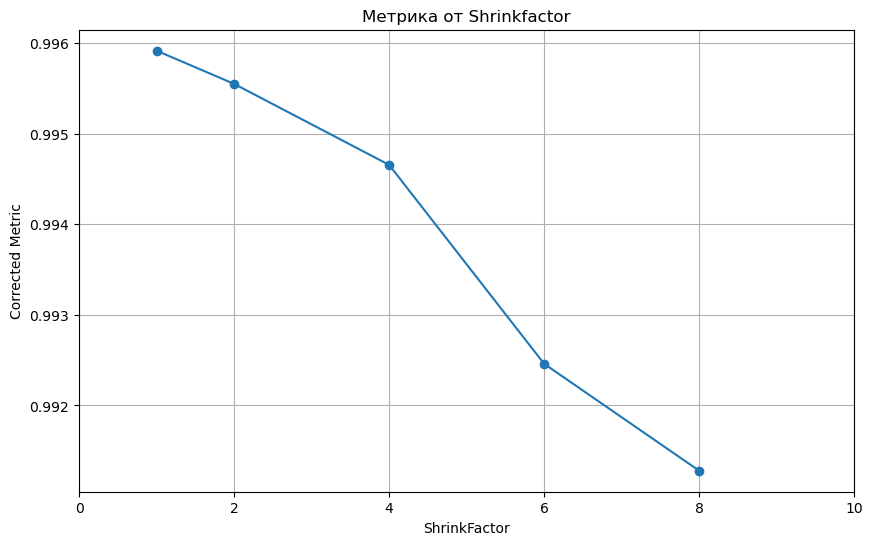

In [68]:
import SimpleITK as sitk
import numpy as np
import matplotlib.pyplot as plt
import sys
import time

def calculate_metrics(input_array, corrected_array, region_y, region_height):
    original_slice_200_300_mean = input_array[region_y:region_y + region_height, 200:300].mean()
    original_slice_70_430_mean = input_array[region_y:region_y + region_height, 70:430].mean()
    original_metric = original_slice_200_300_mean / original_slice_70_430_mean

    corrected_slice_200_300_mean = corrected_array[region_y:region_y + region_height, 200:300].mean()
    corrected_slice_70_430_mean = corrected_array[region_y:region_y + region_height, 70:430].mean()
    corrected_metric = corrected_slice_200_300_mean / corrected_slice_70_430_mean

    return original_metric, corrected_metric

def main(args):
    if len(args) < 2:
        print("Usage: N4BiasFieldCorrection inputImage " +
              "outputImage [shrinkFactor] [maskImage] [numberOfIterations] " +
              "[numberFittingLevels]")
        sys.exit(1)

    inputImage = sitk.ReadImage(args[1], sitk.sitkFloat32)
    original_array = sitk.GetArrayFromImage(inputImage)

    maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 120)

    corrector = sitk.N4BiasFieldCorrectionImageFilter()
    numberFittingLevels = int(args[6]) if len(args) > 6 else 4
    if len(args) > 5:
        corrector.SetMaximumNumberOfIterations([int(args[5])] * numberFittingLevels)

    height, width = original_array.shape
    region_height = 20
    region_y = height // 2 - region_height // 2

    metrics_for_shrink_factors = {}
    corrected_metrics = []
    sh = [1, 2, 4, 6, 8]
    
    for shrinkFactor in sh:
        print(f"Shrink Factor: {shrinkFactor}")

        if shrinkFactor > 1:
            image = sitk.Shrink(inputImage, [shrinkFactor] * inputImage.GetDimension())
            mask_shrunk = sitk.Shrink(maskImage, [shrinkFactor] * inputImage.GetDimension())
        else:
            image = inputImage
            mask_shrunk = maskImage

        start_time = time.time()
        corrected_image = corrector.Execute(image, mask_shrunk)
        log_bias_field = corrector.GetLogBiasFieldAsImage(inputImage)
        corrected_image_full_resolution = inputImage / sitk.Exp(log_bias_field)
        corrected_array = sitk.GetArrayFromImage(corrected_image_full_resolution)

        end_time = time.time()
        print(f"Image correction for shrinkFactor={shrinkFactor} took {end_time - start_time:.2f} seconds.")

        original_metric, corrected_metric = calculate_metrics(original_array, corrected_array, region_y, region_height)
        metrics_for_shrink_factors[shrinkFactor] = (original_metric, corrected_metric)
        corrected_metrics.append(corrected_metric)

        print(f"Original Image Metric for shrinkFactor={shrinkFactor}: {original_metric:.4f}")
        print(f"Corrected Image Metric for shrinkFactor={shrinkFactor}: {corrected_metric:.4f}")

    print("\nMetrics for each shrinkFactor:")
    for sf, metrics in metrics_for_shrink_factors.items():
        print(f"ShrinkFactor = {sf}: Original Metric = {metrics[0]:.4f}, Corrected Metric = {metrics[1]:.4f}")

    # Построение графика зависимости скорректированной метрики от shrinkFactor
    plt.figure(figsize=(10, 6))
    plt.plot(sh, corrected_metrics, marker='o')
    plt.title('Метрика от Shrinkfactor')
    plt.xlabel('ShrinkFactor')
    plt.ylabel('Corrected Metric')
    plt.xticks([0, 2, 4, 6, 8, 10])
    plt.grid(True)
    plt.show()

args = [
    "script",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00340_corrected.nrrd",
    "1",
    "10",
]

main(args)


Shrink Factor: 1
Image correction for shrinkFactor=1 took 6.93 seconds.
Original Image Metric for shrinkFactor=1: 0.9784
Corrected Image Metric for shrinkFactor=1: 0.9959
Shrink Factor: 5
Image correction for shrinkFactor=5 took 1.64 seconds.
Original Image Metric for shrinkFactor=5: 0.9784
Corrected Image Metric for shrinkFactor=5: 0.9915
Shrink Factor: 10
Image correction for shrinkFactor=10 took 1.53 seconds.
Original Image Metric for shrinkFactor=10: 0.9784
Corrected Image Metric for shrinkFactor=10: 1.0005


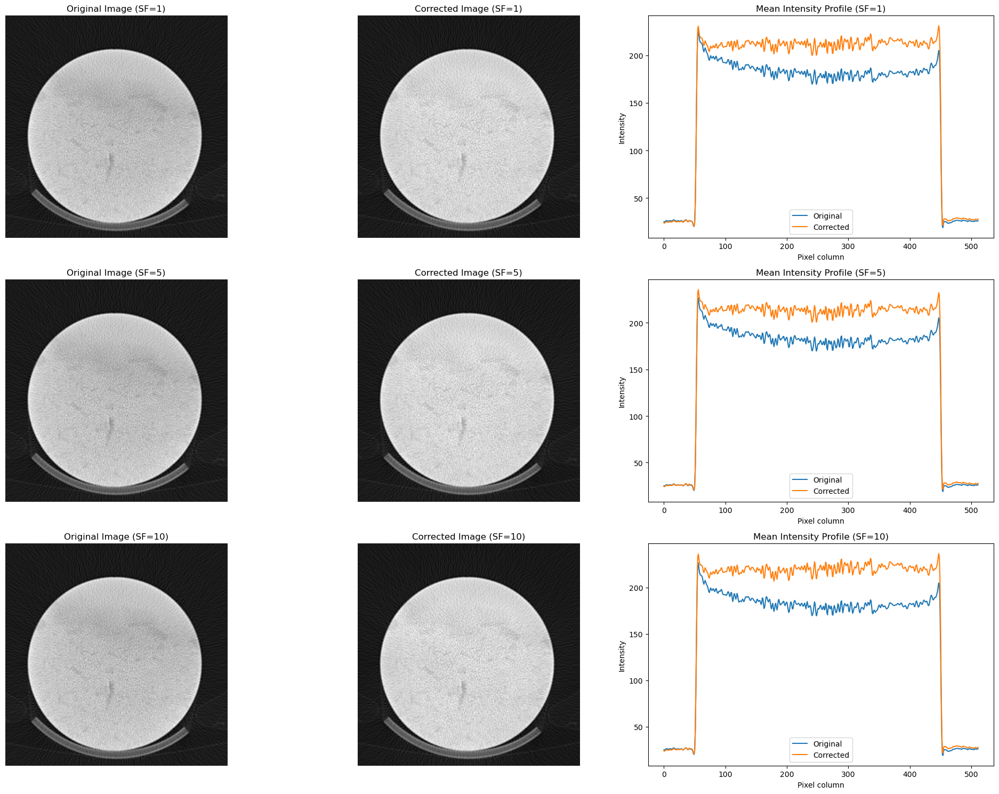


Metrics for each shrinkFactor:
ShrinkFactor = 1: Original Metric = 0.9784, Corrected Metric = 0.9959
ShrinkFactor = 5: Original Metric = 0.9784, Corrected Metric = 0.9915
ShrinkFactor = 10: Original Metric = 0.9784, Corrected Metric = 1.0005


In [61]:
import SimpleITK as sitk
import numpy as np
import matplotlib.pyplot as plt
import sys
import time

def calculate_metrics(input_array, corrected_array, region_y, region_height):
    original_slice_200_300_mean = input_array[region_y:region_y + region_height, 200:300].mean()
    original_slice_70_430_mean = input_array[region_y:region_y + region_height, 70:430].mean()
    original_metric = original_slice_200_300_mean / original_slice_70_430_mean

    corrected_slice_200_300_mean = corrected_array[region_y:region_y + region_height, 200:300].mean()
    corrected_slice_70_430_mean = corrected_array[region_y:region_y + region_height, 70:430].mean()
    corrected_metric = corrected_slice_200_300_mean / corrected_slice_70_430_mean

    return original_metric, corrected_metric

def main(args):
    if len(args) < 2:
        print("Usage: N4BiasFieldCorrection inputImage " +
              "outputImage [shrinkFactor] [maskImage] [numberOfIterations] " +
              "[numberFittingLevels]")
        sys.exit(1)

    inputImage = sitk.ReadImage(args[1], sitk.sitkFloat32)
    original_array = sitk.GetArrayFromImage(inputImage)

    maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 150)
    corrector = sitk.N4BiasFieldCorrectionImageFilter()
    numberFittingLevels = int(args[6]) if len(args) > 6 else 4
    if len(args) > 5:
        corrector.SetMaximumNumberOfIterations([int(args[5])] * numberFittingLevels)

    height, width = original_array.shape
    region_height = 20
    region_y = height // 2 - region_height // 2

    metrics_for_shrink_factors = {}
    plt.figure(figsize=(20, 15))

    for sf_idx, shrinkFactor in enumerate([1, 5, 10]): 
        print(f"Shrink Factor: {shrinkFactor}")

        if shrinkFactor > 1:
            image = sitk.Shrink(inputImage, [shrinkFactor] * inputImage.GetDimension())
            mask_shrunk = sitk.Shrink(maskImage, [shrinkFactor] * inputImage.GetDimension())
        else:
            image = inputImage
            mask_shrunk = maskImage

        start_time = time.time()
        corrected_image = corrector.Execute(image, mask_shrunk)
        log_bias_field = corrector.GetLogBiasFieldAsImage(inputImage)
        corrected_image_full_resolution = inputImage / sitk.Exp(log_bias_field)
        corrected_array = sitk.GetArrayFromImage(corrected_image_full_resolution)

        end_time = time.time()
        print(f"Image correction for shrinkFactor={shrinkFactor} took {end_time - start_time:.2f} seconds.")

        original_metric, corrected_metric = calculate_metrics(original_array, corrected_array, region_y, region_height)
        metrics_for_shrink_factors[shrinkFactor] = (original_metric, corrected_metric)

        print(f"Original Image Metric for shrinkFactor={shrinkFactor}: {original_metric:.4f}")
        print(f"Corrected Image Metric for shrinkFactor={shrinkFactor}: {corrected_metric:.4f}")

        # Визуализация результатов для данного shrinkFactor
        plt.subplot(3, 3, 3 * sf_idx + 1)
        plt.imshow(original_array, cmap='gray')
        plt.title(f'Original Image (SF={shrinkFactor})')
        plt.axis('off')

        plt.subplot(3, 3, 3 * sf_idx + 2)
        plt.imshow(corrected_array, cmap='gray')
        plt.title(f'Corrected Image (SF={shrinkFactor})')
        plt.axis('off')

        plt.subplot(3, 3, 3 * sf_idx + 3)
        plt.plot(original_array[region_y:region_y + region_height, :].mean(axis=0), label='Original')
        plt.plot(corrected_array[region_y:region_y + region_height, :].mean(axis=0), label='Corrected')
        plt.title(f'Mean Intensity Profile (SF={shrinkFactor})')
        plt.xlabel('Pixel column')
        plt.ylabel('Intensity')
        plt.legend()

    plt.tight_layout()
    plt.show()

    print("\nMetrics for each shrinkFactor:")
    for sf, metrics in metrics_for_shrink_factors.items():
        print(f"ShrinkFactor = {sf}: Original Metric = {metrics[0]:.4f}, Corrected Metric = {metrics[1]:.4f}")

args = [
    "script",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00340_corrected.nrrd",
    "1",
    "10",
]

main(args)


### Iterations

#### Изменение метрики

Number of Iterations 5: Correction 1.54 seconds.
Original Image Metric for iterations = 5: 0.9784
Corrected Image Metric for iterations = 5: 0.9969


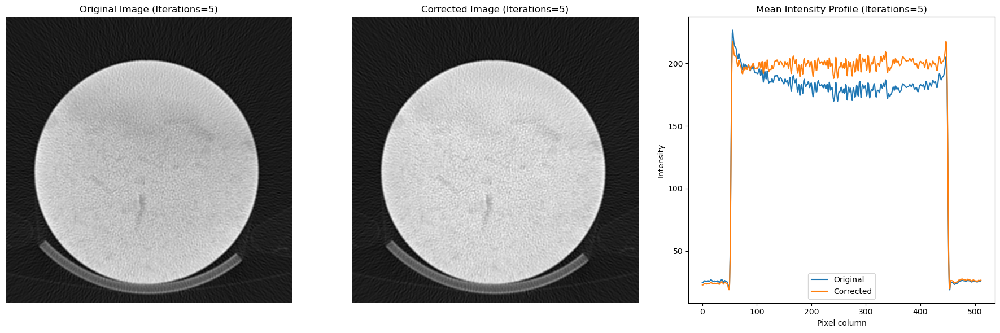

Number of Iterations 10: Correction 2.61 seconds.
Original Image Metric for iterations = 10: 0.9784
Corrected Image Metric for iterations = 10: 0.9959


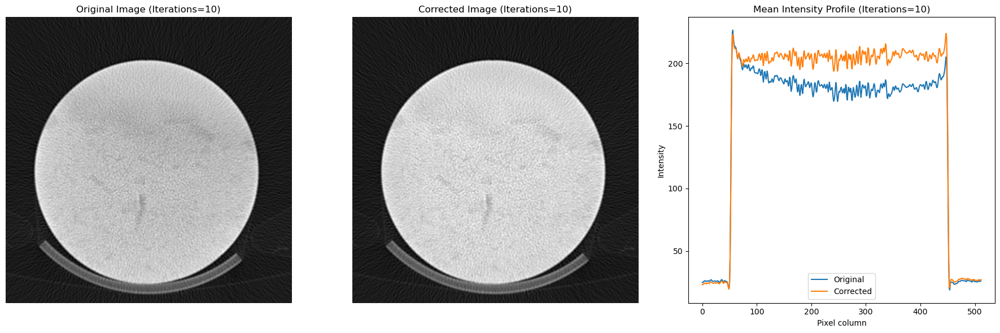

Number of Iterations 15: Correction 3.27 seconds.
Original Image Metric for iterations = 15: 0.9784
Corrected Image Metric for iterations = 15: 0.9959


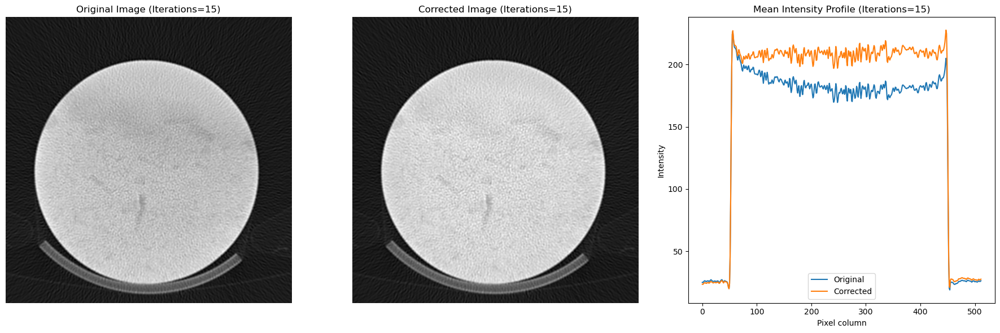

Number of Iterations 20: Correction 3.48 seconds.
Original Image Metric for iterations = 20: 0.9784
Corrected Image Metric for iterations = 20: 0.9959


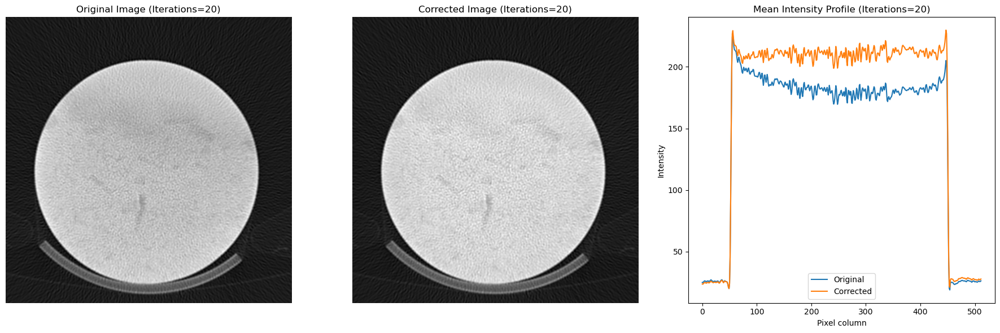

Number of Iterations 50: Correction 3.89 seconds.
Original Image Metric for iterations = 50: 0.9784
Corrected Image Metric for iterations = 50: 0.9959


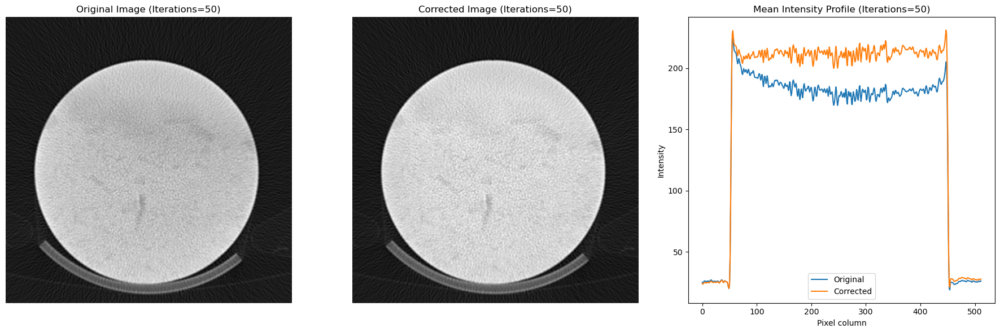

Number of Iterations 70: Correction 3.64 seconds.
Original Image Metric for iterations = 70: 0.9784
Corrected Image Metric for iterations = 70: 0.9959


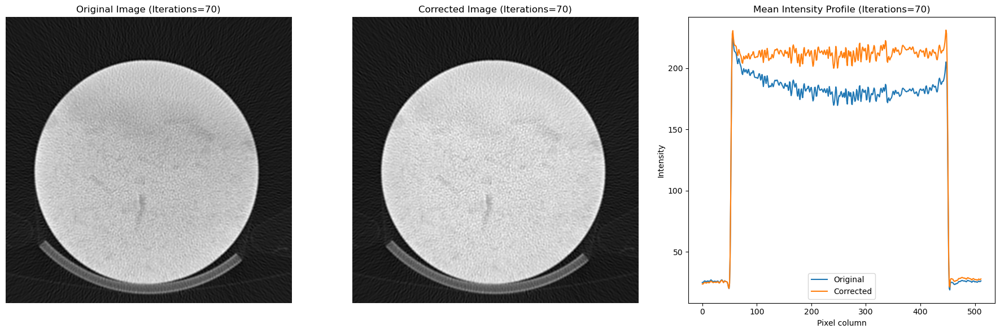

Number of Iterations 100: Correction 3.54 seconds.
Original Image Metric for iterations = 100: 0.9784
Corrected Image Metric for iterations = 100: 0.9959


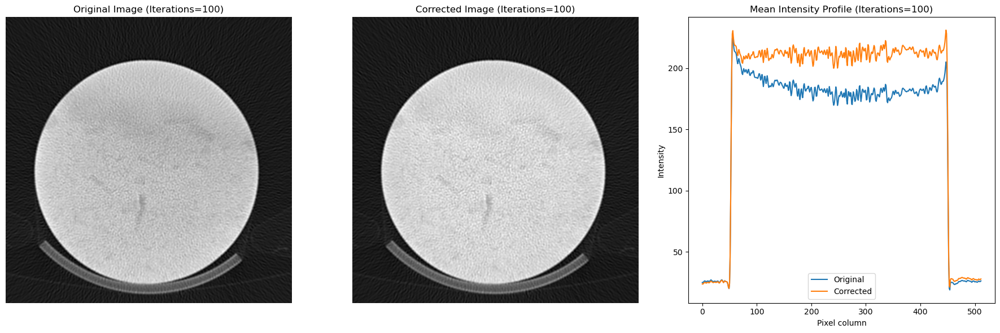


Metrics for each iteration setting:
Iterations = 5: Original Metric = 0.9784, Corrected Metric = 0.9969
Iterations = 10: Original Metric = 0.9784, Corrected Metric = 0.9959
Iterations = 15: Original Metric = 0.9784, Corrected Metric = 0.9959
Iterations = 20: Original Metric = 0.9784, Corrected Metric = 0.9959
Iterations = 50: Original Metric = 0.9784, Corrected Metric = 0.9959
Iterations = 70: Original Metric = 0.9784, Corrected Metric = 0.9959
Iterations = 100: Original Metric = 0.9784, Corrected Metric = 0.9959


In [86]:
import matplotlib.pyplot as plt
import SimpleITK as sitk
import numpy as np
import time

def calculate_metrics(input_array, corrected_array, region_y, region_height):
    original_slice_200_300_mean = input_array[region_y:region_y + region_height, 200:300].mean()
    original_slice_70_430_mean = input_array[region_y:region_y + region_height, 70:430].mean()
    original_metric = original_slice_200_300_mean / original_slice_70_430_mean

    corrected_slice_200_300_mean = corrected_array[region_y:region_y + region_height, 200:300].mean()
    corrected_slice_70_430_mean = corrected_array[region_y:region_y + region_height, 70:430].mean()
    corrected_metric = corrected_slice_200_300_mean / corrected_slice_70_430_mean

    return original_metric, corrected_metric

def run_experiment(args):
    inputImage = sitk.ReadImage(args[1], sitk.sitkFloat32)
    original_array = sitk.GetArrayFromImage(inputImage)
    number_of_iterations_options = [5, 10, 15, 20, 50, 70, 100]

    results_time_iter = []
    results_metric_iter = []
    original_metrics_list = []

    height, width = original_array.shape
    region_height = 20
    region_y = height // 2 - region_height // 2

    for numberOfIterations in number_of_iterations_options:
        image = inputImage
        maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 120)

        corrector = sitk.N4BiasFieldCorrectionImageFilter()
        numberFittingLevels = 4
        corrector.SetMaximumNumberOfIterations([numberOfIterations] * numberFittingLevels)

        # Start timing
        start_time = time.time()

        corrected_image = corrector.Execute(image, maskImage)

        # End timing
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"Number of Iterations {numberOfIterations}: Correction {elapsed_time:.2f} seconds.")
        results_time_iter.append(elapsed_time)

        # Calculate metrics
        corrected_array = sitk.GetArrayFromImage(corrected_image)
        original_metric, corrected_metric = calculate_metrics(original_array, corrected_array, region_y, region_height)
        results_metric_iter.append(corrected_metric)
        original_metrics_list.append(original_metric)

        print(f"Original Image Metric for iterations = {numberOfIterations}: {original_metric:.4f}")
        print(f"Corrected Image Metric for iterations = {numberOfIterations}: {corrected_metric:.4f}")

        # Visualize results
        plt.figure(figsize=(18, 6))

        # Original image
        plt.subplot(1, 3, 1)
        plt.imshow(original_array, cmap='gray')
        plt.title(f'Original Image (Iterations={numberOfIterations})')
        plt.axis('off')

        # Corrected image
        plt.subplot(1, 3, 2)
        plt.imshow(corrected_array, cmap='gray')
        plt.title(f'Corrected Image (Iterations={numberOfIterations})')
        plt.axis('off')

        # Mean intensity profile
        plt.subplot(1, 3, 3)
        plt.plot(original_array[region_y:region_y + region_height, :].mean(axis=0), label='Original')
        plt.plot(corrected_array[region_y:region_y + region_height, :].mean(axis=0), label='Corrected')
        plt.title(f'Mean Intensity Profile (Iterations={numberOfIterations})')
        plt.xlabel('Pixel column')
        plt.ylabel('Intensity')
        plt.legend()

        plt.tight_layout()
        plt.show()

    print("\nMetrics for each iteration setting:")
    for iters, original_metric, corrected_metric in zip(number_of_iterations_options, original_metrics_list, results_metric_iter):
        print(f"Iterations = {iters}: Original Metric = {original_metric:.4f}, Corrected Metric = {corrected_metric:.4f}")

args = [
    "script",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00340_corrected.nrrd",
]

run_experiment(args)


#### Затраты по времени

Number of Iterations 3: Correction 0.89 seconds.
Corrected Image Metric for iterations=3: 1.0001
Number of Iterations 5: Correction 1.52 seconds.
Corrected Image Metric for iterations=5: 0.9969
Number of Iterations 10: Correction 2.47 seconds.
Corrected Image Metric for iterations=10: 0.9959
Number of Iterations 15: Correction 3.09 seconds.
Corrected Image Metric for iterations=15: 0.9959
Number of Iterations 20: Correction 3.27 seconds.
Corrected Image Metric for iterations=20: 0.9959
Number of Iterations 50: Correction 3.35 seconds.
Corrected Image Metric for iterations=50: 0.9959
Number of Iterations 70: Correction 3.59 seconds.
Corrected Image Metric for iterations=70: 0.9959
Number of Iterations 100: Correction 3.40 seconds.
Corrected Image Metric for iterations=100: 0.9959


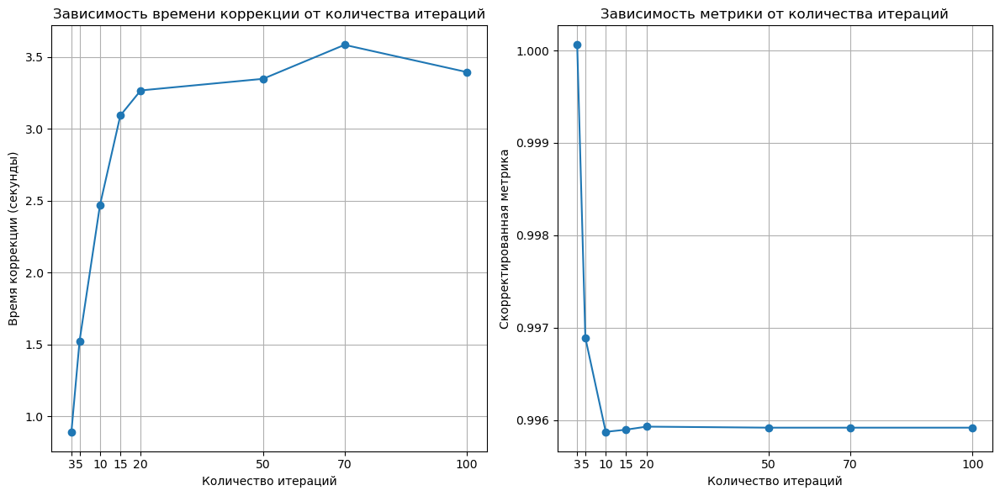

In [87]:
import matplotlib.pyplot as plt
import SimpleITK as sitk
import numpy as np
import time

def calculate_metrics(input_array, corrected_array, region_y, region_height):
    original_slice_200_300_mean = input_array[region_y:region_y + region_height, 200:300].mean()
    original_slice_70_430_mean = input_array[region_y:region_y + region_height, 70:430].mean()
    original_metric = original_slice_200_300_mean / original_slice_70_430_mean

    corrected_slice_200_300_mean = corrected_array[region_y:region_y + region_height, 200:300].mean()
    corrected_slice_70_430_mean = corrected_array[region_y:region_y + region_height, 70:430].mean()
    corrected_metric = corrected_slice_200_300_mean / corrected_slice_70_430_mean

    return original_metric, corrected_metric

def run_experiment(args):
    inputImage = sitk.ReadImage(args[1], sitk.sitkFloat32)
    original_array = sitk.GetArrayFromImage(inputImage)
    number_of_iterations_options = [3, 5, 10, 15, 20, 50, 70, 100]
    shrinkFactor = 1  

    results_time_iter = []
    results_metric_iter = []

    height, width = original_array.shape
    region_height = 20
    region_y = height // 2 - region_height // 2

    for numberOfIterations in number_of_iterations_options:
        image = inputImage
        maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 120)

        corrector = sitk.N4BiasFieldCorrectionImageFilter()
        numberFittingLevels = 4
        corrector.SetMaximumNumberOfIterations([numberOfIterations] * numberFittingLevels)

        # Start timing
        start_time = time.time()

        corrected_image = corrector.Execute(image, maskImage)

        # End timing
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"Number of Iterations {numberOfIterations}: Correction {elapsed_time:.2f} seconds.")
        results_time_iter.append(elapsed_time)

        # Calculate metrics
        corrected_array = sitk.GetArrayFromImage(corrected_image)
        original_metric, corrected_metric = calculate_metrics(original_array, corrected_array, region_y, region_height)
        results_metric_iter.append(corrected_metric)
        print(f"Corrected Image Metric for iterations={numberOfIterations}: {corrected_metric:.4f}")

    
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(number_of_iterations_options, results_time_iter, marker='o', linestyle='-')
    plt.title('Зависимость времени коррекции от количества итераций')
    plt.xlabel('Количество итераций')
    plt.ylabel('Время коррекции (секунды)')
    plt.xticks(number_of_iterations_options)
    plt.grid()


    plt.subplot(1, 2, 2)
    plt.plot(number_of_iterations_options, results_metric_iter, marker='o', linestyle='-')
    plt.title('Зависимость метрики от количества итераций')
    plt.xlabel('Количество итераций')
    plt.ylabel('Скорректированная метрика')
    plt.xticks(number_of_iterations_options)
    plt.grid()

    plt.tight_layout()
    plt.show()

args = [
    "script",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00340_corrected.nrrd",
]

run_experiment(args)


Number of Iterations 5: Correction 1.41 seconds.
Number of Iterations 10: Correction 2.36 seconds.
Number of Iterations 20: Correction 2.73 seconds.
Number of Iterations 40: Correction 3.78 seconds.
Number of Iterations 80: Correction 3.56 seconds.
Number of Iterations 160: Correction 3.46 seconds.


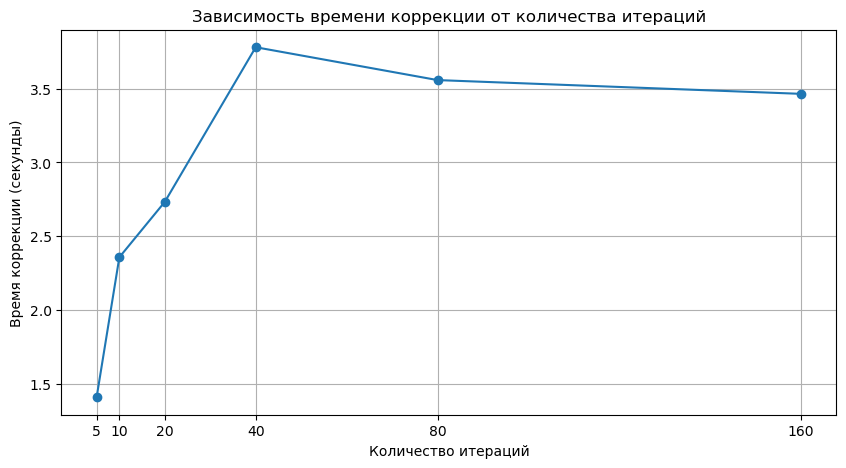

In [72]:
import matplotlib.pyplot as plt
import SimpleITK as sitk
import time

def run_experiment(args):
    inputImage = sitk.ReadImage(args[1], sitk.sitkFloat32)
    number_of_iterations_options = [5, 10, 20, 40, 80, 160]  # Различные значения количества итераций
    shrinkFactor = 1  

    # Список для хранения времени выполнения для каждого количества итераций
    results_time_iter = []

    for numberOfIterations in number_of_iterations_options:
        image = inputImage
        maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 150)

        corrector = sitk.N4BiasFieldCorrectionImageFilter()
        numberFittingLevels = 4
        corrector.SetMaximumNumberOfIterations([numberOfIterations] * numberFittingLevels)

        # Start timing
        start_time = time.time()

        corrected_image = corrector.Execute(image, maskImage)

        # End timing
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"Number of Iterations {numberOfIterations}: Correction {elapsed_time:.2f} seconds.")
        results_time_iter.append(elapsed_time)

    # Построение графика зависимости времени от количества итераций
    plt.figure(figsize=(10, 5))
    plt.plot(number_of_iterations_options, results_time_iter, marker='o', linestyle='-')
    plt.title('Зависимость времени коррекции от количества итераций')
    plt.xlabel('Количество итераций')
    plt.ylabel('Время коррекции (секунды)')
    plt.xticks(number_of_iterations_options)
    plt.grid()
    plt.show()

args = [
    "script",  # имя скрипта
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00340_corrected.nrrd",
]


run_experiment(args)


### Shrinkfactor & Iterations

Shrink factor 1, Iterations 5: Correction took 2.85 seconds.
Shrink factor 2, Iterations 5: Correction took 1.41 seconds.
Shrink factor 3, Iterations 5: Correction took 0.98 seconds.
Shrink factor 4, Iterations 5: Correction took 0.84 seconds.
Shrink factor 5, Iterations 5: Correction took 0.85 seconds.
Shrink factor 1, Iterations 10: Correction took 5.88 seconds.
Shrink factor 2, Iterations 10: Correction took 2.30 seconds.
Shrink factor 3, Iterations 10: Correction took 1.65 seconds.
Shrink factor 4, Iterations 10: Correction took 1.39 seconds.
Shrink factor 5, Iterations 10: Correction took 1.19 seconds.
Shrink factor 1, Iterations 25: Correction took 6.59 seconds.
Shrink factor 2, Iterations 25: Correction took 2.12 seconds.
Shrink factor 3, Iterations 25: Correction took 1.49 seconds.
Shrink factor 4, Iterations 25: Correction took 1.74 seconds.
Shrink factor 5, Iterations 25: Correction took 2.06 seconds.
Shrink factor 1, Iterations 50: Correction took 7.24 seconds.
Shrink factor

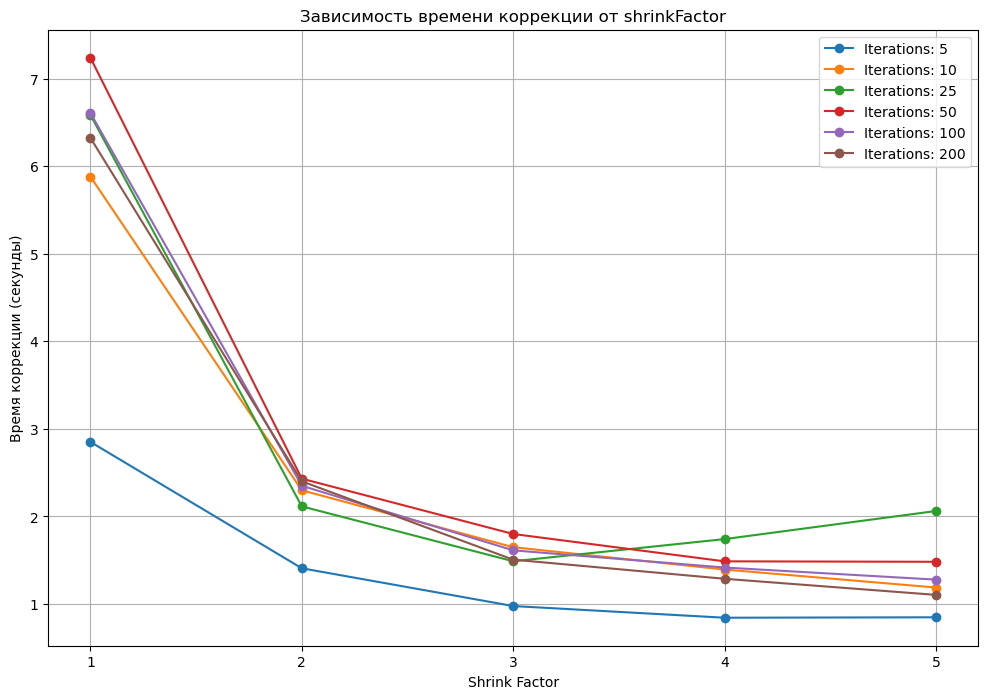

In [17]:
import matplotlib.pyplot as plt
import SimpleITK as sitk
import time

def run_experiment(args):
    inputImage = sitk.ReadImage(args[1], sitk.sitkFloat32)
    number_of_iterations_options = [5, 10, 25, 50, 100, 200]  # Различные значения количества итераций
    shrink_factors = range(1, 6)
    
    # Словарь для хранения времени выполнения для каждой комбинации shrinkFactor и numberOfIterations
    results_time = {iter_count: [] for iter_count in number_of_iterations_options}

    for numberOfIterations in number_of_iterations_options:
        for shrinkFactor in shrink_factors:
            image = inputImage
            maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 150)

            if shrinkFactor > 1:
                image = sitk.Shrink(inputImage, [shrinkFactor] * inputImage.GetDimension())
                maskImage = sitk.Shrink(maskImage, [shrinkFactor] * inputImage.GetDimension())

            corrector = sitk.N4BiasFieldCorrectionImageFilter()
            numberFittingLevels = 4
            corrector.SetMaximumNumberOfIterations([numberOfIterations] * numberFittingLevels)

            # Start timing
            start_time = time.time()

            corrected_image = corrector.Execute(image, maskImage)

            # End timing
            end_time = time.time()
            elapsed_time = end_time - start_time
            print(f"Shrink factor {shrinkFactor}, Iterations {numberOfIterations}: Correction took {elapsed_time:.2f} seconds.")
            results_time[numberOfIterations].append(elapsed_time)


            output_image_path = args[2].replace(".nrrd", f"_shrink_{shrinkFactor}_iter_{numberOfIterations}.nrrd")
            sitk.WriteImage(corrected_image, output_image_path)

    # Построение графиков для каждого количества итераций
    plt.figure(figsize=(12, 8))
    for numberOfIterations, times in results_time.items():
        plt.plot(shrink_factors, times, marker='o', linestyle='-', label=f'Iterations: {numberOfIterations}')
    
    plt.title('Зависимость времени коррекции от shrinkFactor')
    plt.xlabel('Shrink Factor')
    plt.ylabel('Время коррекции (секунды)')
    plt.xticks(shrink_factors)
    plt.legend()
    plt.grid()
    plt.show()

args = [
    "script",  # script name
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00340_corrected.nrrd",
]


run_experiment(args)


### FittingLevels

Number of Fitting Levels 1: Correction took 0.89 seconds.
Corrected Image Metric for fitting levels=1: 0.9798


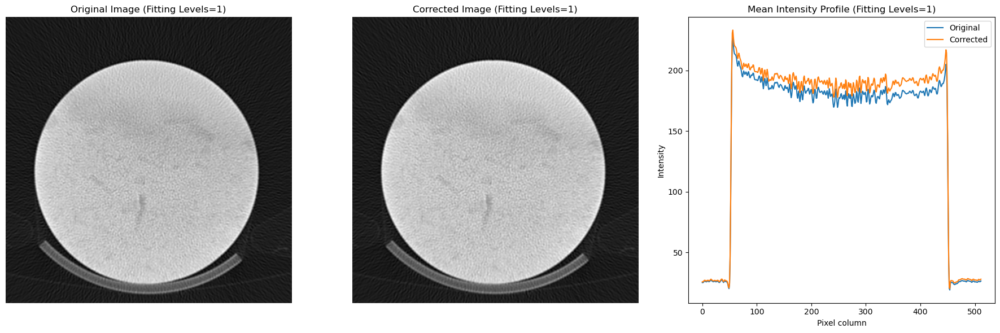

Number of Fitting Levels 3: Correction took 3.24 seconds.
Corrected Image Metric for fitting levels=3: 1.0055


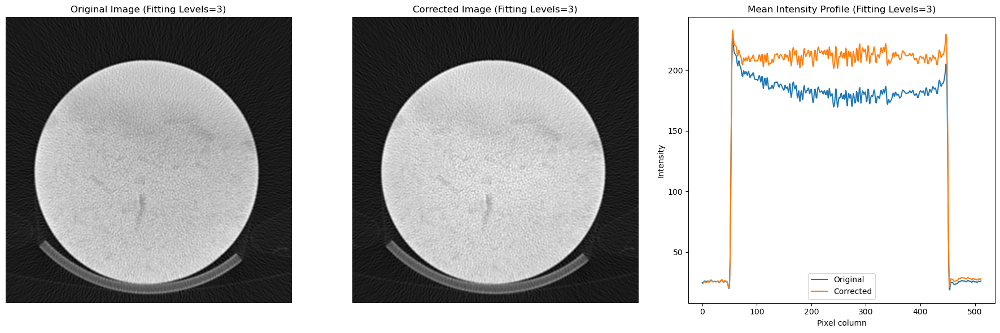

Number of Fitting Levels 6: Correction took 4.54 seconds.
Corrected Image Metric for fitting levels=6: 0.9992


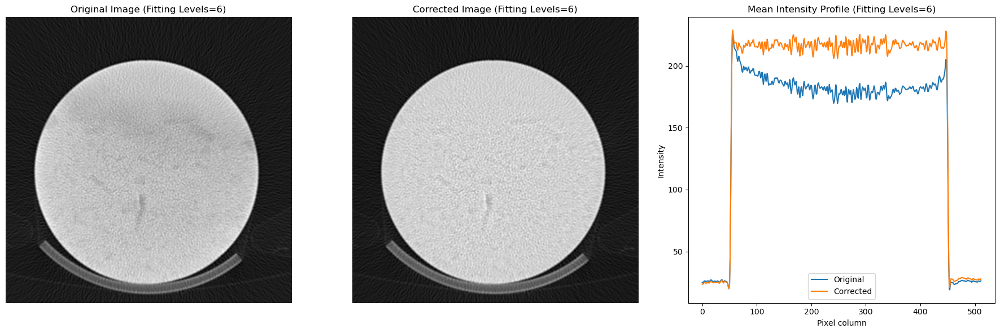

Number of Fitting Levels 9: Correction took 8.57 seconds.
Corrected Image Metric for fitting levels=9: 0.9999


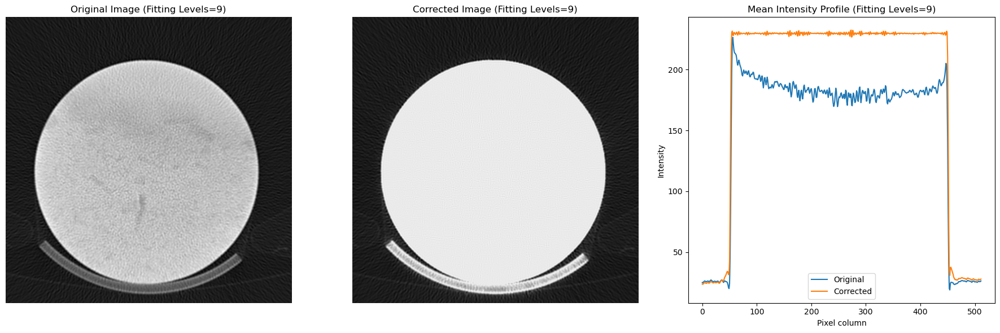

Number of Fitting Levels 12: Correction took 10.83 seconds.
Corrected Image Metric for fitting levels=12: 1.0000


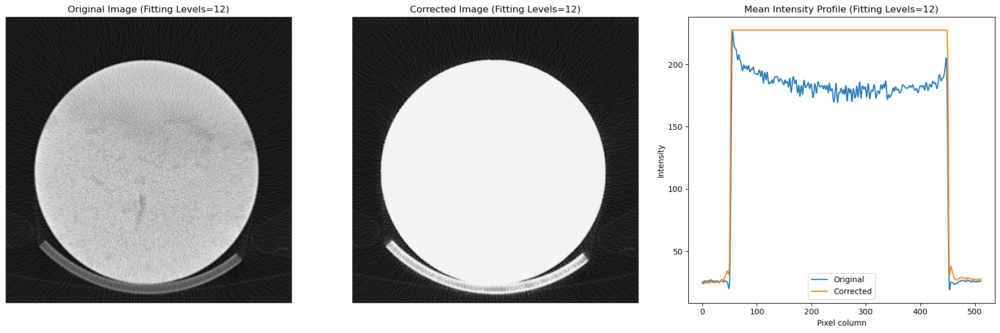

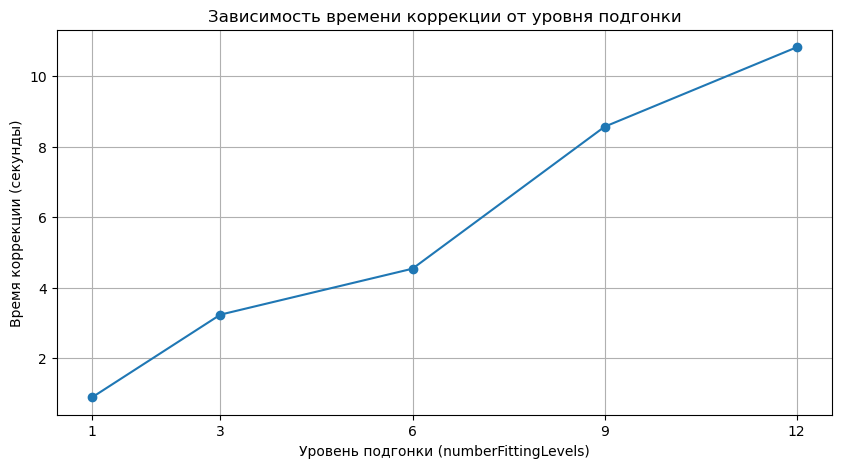


Metrics for each fitting level:
Fitting Levels = 1: Original Metric = 0.9784, Corrected Metric = 0.9798
Fitting Levels = 3: Original Metric = 0.9784, Corrected Metric = 1.0055
Fitting Levels = 6: Original Metric = 0.9784, Corrected Metric = 0.9992
Fitting Levels = 9: Original Metric = 0.9784, Corrected Metric = 0.9999
Fitting Levels = 12: Original Metric = 0.9784, Corrected Metric = 1.0000


In [85]:
import matplotlib.pyplot as plt
import SimpleITK as sitk
import numpy as np
import time

def calculate_metrics(input_array, corrected_array, region_y, region_height):
    # Вычисление средней интенсивности в заданных областях
    original_slice_200_300_mean = input_array[region_y:region_y + region_height, 200:300].mean()
    original_slice_70_430_mean = input_array[region_y:region_y + region_height, 70:430].mean()
    original_metric = original_slice_200_300_mean / original_slice_70_430_mean

    corrected_slice_200_300_mean = corrected_array[region_y:region_y + region_height, 200:300].mean()
    corrected_slice_70_430_mean = corrected_array[region_y:region_y + region_height, 70:430].mean()
    corrected_metric = corrected_slice_200_300_mean / corrected_slice_70_430_mean

    return original_metric, corrected_metric

def run_experiment(args):
    inputImage = sitk.ReadImage(args[1], sitk.sitkFloat32)
    original_array = sitk.GetArrayFromImage(inputImage)
    fitting_levels_options = [1, 3, 6, 9, 12]
    numberOfIterations = 50

    results_time_fitting_levels = []
    results_metric_fitting_levels = []

    height, width = original_array.shape
    region_height = 20
    region_y = height // 2 - region_height // 2
    metrics_for_fitting_levels = {}

    for numberFittingLevels in fitting_levels_options:
        image = inputImage
        maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 150)

        corrector = sitk.N4BiasFieldCorrectionImageFilter()
        corrector.SetMaximumNumberOfIterations([numberOfIterations] * numberFittingLevels)

        # Start timing
        start_time = time.time()

        corrected_image = corrector.Execute(image, maskImage)

        # End timing
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"Number of Fitting Levels {numberFittingLevels}: Correction took {elapsed_time:.2f} seconds.")
        results_time_fitting_levels.append(elapsed_time)

        # Calculate metrics
        corrected_array = sitk.GetArrayFromImage(corrected_image)
        original_metric, corrected_metric = calculate_metrics(original_array, corrected_array, region_y, region_height)
        results_metric_fitting_levels.append(corrected_metric)
        metrics_for_fitting_levels[numberFittingLevels] = (original_metric, corrected_metric)
        print(f"Corrected Image Metric for fitting levels={numberFittingLevels}: {corrected_metric:.4f}")

        # Visualize results
        plt.figure(figsize=(18, 6))

        # Original image
        plt.subplot(1, 3, 1)
        plt.imshow(original_array, cmap='gray')
        plt.title(f'Original Image (Fitting Levels={numberFittingLevels})')
        plt.axis('off')

        # Corrected image
        plt.subplot(1, 3, 2)
        plt.imshow(corrected_array, cmap='gray')
        plt.title(f'Corrected Image (Fitting Levels={numberFittingLevels})')
        plt.axis('off')

        # Mean intensity profile
        plt.subplot(1, 3, 3)
        plt.plot(original_array[region_y:region_y + region_height, :].mean(axis=0), label='Original')
        plt.plot(corrected_array[region_y:region_y + region_height, :].mean(axis=0), label='Corrected')
        plt.title(f'Mean Intensity Profile (Fitting Levels={numberFittingLevels})')
        plt.xlabel('Pixel column')
        plt.ylabel('Intensity')
        plt.legend()

        plt.tight_layout()
        plt.show()

    # Построение графика зависимости времени от уровня подгонки
    plt.figure(figsize=(10, 5))
    plt.plot(fitting_levels_options, results_time_fitting_levels, marker='o', linestyle='-')
    plt.title('Зависимость времени коррекции от уровня подгонки')
    plt.xlabel('Уровень подгонки (numberFittingLevels)')
    plt.ylabel('Время коррекции (секунды)')
    plt.xticks(fitting_levels_options)
    plt.grid()
    plt.show()

    print("\nMetrics for each fitting level:")
    for levels, metrics in metrics_for_fitting_levels.items():
        print(f"Fitting Levels = {levels}: Original Metric = {metrics[0]:.4f}, Corrected Metric = {metrics[1]:.4f}")

args = [
    "script",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00340_corrected.nrrd",
]

run_experiment(args)


Number of Fitting Levels 1: Correction took 1.73 seconds.
Number of Fitting Levels 3: Correction took 5.60 seconds.
Number of Fitting Levels 6: Correction took 8.44 seconds.
Number of Fitting Levels 9: Correction took 15.72 seconds.
Number of Fitting Levels 12: Correction took 23.94 seconds.


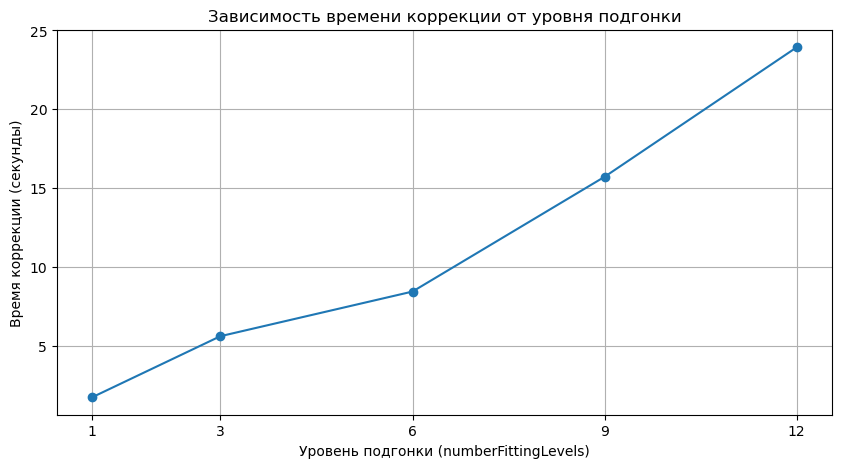

In [23]:
import matplotlib.pyplot as plt
import SimpleITK as sitk
import time

def run_experiment(args):
    inputImage = sitk.ReadImage(args[1], sitk.sitkFloat32)
    fitting_levels_options = [1, 3, 6, 9, 12]  # Различные уровни подгонки
    numberOfIterations = 50  # количество итераций 
    shrinkFactor = 1  # 

    # Список для хранения времени выполнения для каждого уровня подгонки
    results_time_fitting_levels = []

    for numberFittingLevels in fitting_levels_options:
        image = inputImage
        maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 150)

        corrector = sitk.N4BiasFieldCorrectionImageFilter()
        corrector.SetMaximumNumberOfIterations([numberOfIterations] * numberFittingLevels)

        # Start timing
        start_time = time.time()

        corrected_image = corrector.Execute(image, maskImage)

        # End timing
        end_time = time.time()
        elapsed_time = end_time - start_time
        print(f"Number of Fitting Levels {numberFittingLevels}: Correction took {elapsed_time:.2f} seconds.")
        results_time_fitting_levels.append(elapsed_time)

    # Построение графика зависимости времени от уровня подгонки
    plt.figure(figsize=(10, 5))
    plt.plot(fitting_levels_options, results_time_fitting_levels, marker='o', linestyle='-')
    plt.title('Зависимость времени коррекции от уровня подгонки')
    plt.xlabel('Уровень подгонки (numberFittingLevels)')
    plt.ylabel('Время коррекции (секунды)')
    plt.xticks(fitting_levels_options)
    plt.grid()
    plt.show()

args = [
    "script",  # имя скрипта
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00340_corrected.nrrd",
]


run_experiment(args)


## Черновое

Ratio S1/S0 for image: 0.0625


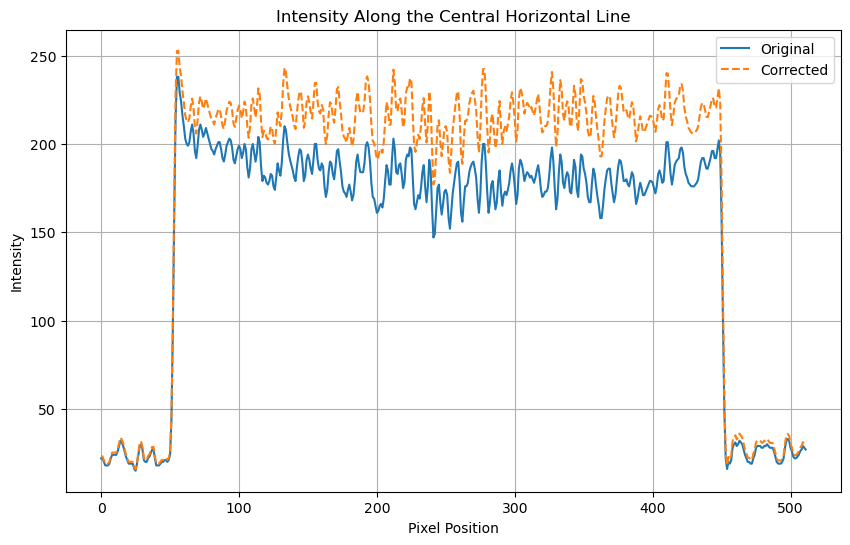

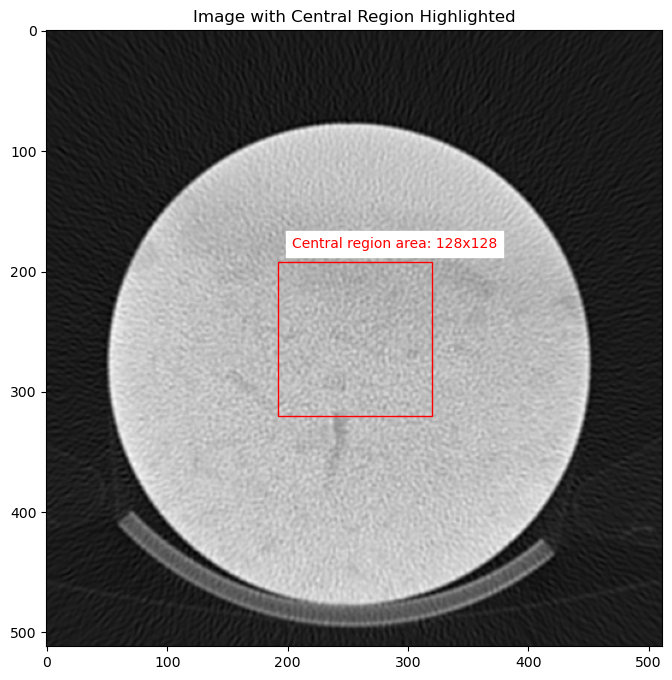

In [17]:
import sys
import SimpleITK as sitk
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

def calculate_central_ratio(image_array, central_fraction=0.75):
    h, w = image_array.shape
    central_h_start = int(h * central_fraction / 2)
    central_h_end = int(h * (1 - central_fraction / 2))
    central_w_start = int(w * central_fraction / 2)
    central_w_end = int(w * (1 - central_fraction / 2))

    central_region = image_array[central_h_start:central_h_end, central_w_start:central_w_end]

    S0 = np.prod(image_array.shape)
    S1 = np.prod(central_region.shape)

    return S1 / S0, (central_h_start, central_h_end, central_w_start, central_w_end)

def plot_image_with_central_region(image_array, central_box):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(image_array, cmap='gray')
    ax.set_title("Image with Central Region Highlighted")

    height = central_box[1] - central_box[0]
    width = central_box[3] - central_box[2]
    rect = patches.Rectangle((central_box[2], central_box[0]), width, height,
                             linewidth=1, edgecolor='red', facecolor='none')

    ax.add_patch(rect)
    ax.annotate(f'Central region area: {height}x{width}', (central_box[2], central_box[0]),
                color='red', xytext=(10, 10), textcoords='offset points', backgroundcolor='white')
    plt.show()

def main(args):
    if len(args) < 3:
        print("Insufficient arguments. Usage: script <input_image> <output_image>")
        sys.exit(1)

    # Arguments
    input_path = args[1]
    output_path = args[2]
    
    input_image = sitk.ReadImage(input_path, sitk.sitkFloat32)
    
    # N4 Bias field correction
    corrector = sitk.N4BiasFieldCorrectionImageFilter()
    corrected_image = corrector.Execute(input_image)

    sitk.WriteImage(corrected_image, output_path)

    input_array = sitk.GetArrayFromImage(input_image)
    corrected_array = sitk.GetArrayFromImage(corrected_image)

    input_ratio, central_indices = calculate_central_ratio(input_array)
    corrected_ratio, _ = calculate_central_ratio(corrected_array)

    print(f"Ratio S1/S0 for image: {input_ratio:.4f}")

    # Plotting intensity along the central line
    plt.figure(figsize=(10, 6))
    plt.plot(input_array[input_array.shape[0] // 2, :], label='Original')
    plt.plot(corrected_array[corrected_array.shape[0] // 2, :], label='Corrected', linestyle='dashed')
    plt.title("Intensity Along the Central Horizontal Line")
    plt.xlabel("Pixel Position")
    plt.ylabel("Intensity")
    plt.legend()
    plt.grid(True)
    plt.show()

    plot_image_with_central_region(input_array, central_indices)

args = [
    "script",  # имя скрипта
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test\00340.png",
    r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00340_corrected.nrrd",
    # "2", # shrinkFactor
    # None, # maskImage
    # "10", # numberOfIterations
    # "5" # numberFittingLevels
]


if __name__ == '__main__':
    main(args)


# N4 прокрутка всего стека

In [10]:
import os
import SimpleITK as sitk
import time

def convert_image_to_uint16(image):
    # Нормализуем изображение к диапазону [0, 65535]
    image_65535 = sitk.RescaleIntensity(image, 0, 65535)
    # Конвертируем тип данных изображения в unsigned short
    return sitk.Cast(image_65535, sitk.sitkUInt16)

def process_images(input_folder, output_folder, shrinkFactor=1, numberOfIterations=50, numberFittingLevels=4):
    if not os.path.exists(input_folder):
        print("Input folder does not exist")
        return
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    files = [os.path.join(input_folder, f) for f in os.listdir(input_folder) if
             os.path.isfile(os.path.join(input_folder, f)) and f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff'))]
    start_time = time.time()
    for file_path in files:
        file_name = os.path.basename(file_path)
        try:
            start_file_time = time.time()
            inputImage = sitk.ReadImage(file_path, sitk.sitkFloat32)
            maskImage = sitk.OtsuThreshold(inputImage, 0, 1, 200)
            image = sitk.Shrink(inputImage, [shrinkFactor] * inputImage.GetDimension()) if shrinkFactor > 1 else inputImage

            corrector = sitk.N4BiasFieldCorrectionImageFilter()
            corrector.SetMaximumNumberOfIterations([numberOfIterations] * numberFittingLevels)
            
            corrected_image = corrector.Execute(image, maskImage)
            corrected_full_resolution = inputImage / sitk.Exp(corrector.GetLogBiasFieldAsImage(inputImage))
            corrected_full_resolution_uint16 = convert_image_to_uint16(corrected_full_resolution)

            output_filename = os.path.join(output_folder, os.path.splitext(file_name)[0] + '_corrected.png')
            sitk.WriteImage(corrected_full_resolution_uint16, output_filename)

            file_processing_time = time.time() - start_file_time
            print(f"Processed {file_name} -> {output_filename} in {file_processing_time:.2f} seconds")
        except Exception as e:
            print(f"Failed to process {file_name}: {e}")
    total_processing_time = time.time() - start_time
    print(f"Total processing time: {total_processing_time:.2f} seconds")

In [12]:
input_folder = r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\start\test"
output_folder = r"C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4"


process_images(input_folder, output_folder)

Processed 00006.png -> C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00006_corrected.png in 3.55 seconds
Processed 00007.png -> C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00007_corrected.png in 6.36 seconds
Processed 00008.png -> C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00008_corrected.png in 11.14 seconds
Processed 00009.png -> C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00009_corrected.png in 7.95 seconds
Processed 00251.png -> C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00251_corrected.png in 5.55 seconds
Processed 00340.png -> C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00340_corrected.png in 3.82 seconds
Processed 00456.png -> C:\Users\abely\OneDrive\Desktop\tomograph\snimki\corrected\test_correctedN4\00456_corrected.png in 2.74 seconds
Processed 00479.png -> C:\Users\abely\OneDrive\Desktop

```{note}
:class: dropdown
1. inputImage (`args[1]`): Путь к входному изображению. Это первый и обязательный параметр, который должен быть указан. Изображение считывается и конвертируется в формат `sitk.sitkFloat32`.

2. outputImage (`args[2]`): Путь для сохранения скорректированного изображения в полном разрешении. Это второй обязательный параметр скрипта.

3. shrinkFactor (`args[3]`, необязательный): Коэффициент уменьшения изображения, используемый для ускорения процесса коррекции. Если параметр опущен, shrink factor по умолчанию равен 1 (то есть изменений размера не производится). Если коэффициент больше 1, изображение и маска уменьшаются по размеру, что ускоряет обработку.

4. maskImage (`args[4]`, необязательный): Путь к изображению маски. Если маска не предоставлена, она создаётся автоматически с использованием порога по входному изображению. Маска определяет области изображения, которые будут использоваться корректором для анализа и устранения смещения интенсивности.

5. numberOfIterations (`args[5]`, необязательный): Максимальное число итераций для корректора. Это значение определяет, сколько раз алгоритм будет пытаться минимизировать ошибку коррекции. Большее количество итераций может улучшить качество коррекции за счёт увеличения времени обработки.

6. numberOfFittingLevels (`args[6]`, необязательный): Число уровней фитинга. Этот параметр контролирует сложность модели смещения поля, где большее число уровней может позволить алгоритму более точно скорректировать большие и сложные смещения поля.
```